<a href="https://colab.research.google.com/github/Pratyushk2003/Disease-Prediction-using-Catboost/blob/main/Final_Epiliptic_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [169]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import recall_score, accuracy_score, confusion_matrix, f1_score, matthews_corrcoef
from sklearn.metrics import precision_score, auc, roc_auc_score, roc_curve, precision_recall_curve, classification_report
import pickle
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
warnings.filterwarnings('ignore')

In [170]:
# loading the dataset to a Pandas DataFrame
df = pd.read_excel('/content/Copy_epileptic_seizures_Responses_New.xlsx')
df.head(5)

,CaseNo,PatientAge,Gender,EventDuration,Stereotypic,events_occur_time,wandering_headbanging_observation,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,...,fixed_Aura_Premonition,staring_blankly_chewing_smacking_lips,posturing_limbeyehead_deviation,violent_thrashing_movements,recovery,bittentongue,urine_without_knowledge,dislocated_shoulder,other_injuries,Final_Diagnosis
0,569502_C,18.0,Female,d. More than 10 minutes,"a. Yes, all are same",b. Only during wakefulness,b. No,a. Yes,a. Yes,b. No,...,a. Yes,b. No,a. Yes,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,b. Non epileptic spell
1,569498_C,26.0,Male,b. 1-5 minutes,"a. Yes, all are same",b. Only during wakefulness,b. No,a. Yes,b. No,b. No,...,b. No,b. No,b. No,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,a. Epileptic Seizure
2,546077_C,17.0,Male,c. 5-10 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,NaN,b. No,b. No,b. No,...,b. No,b. No,a. Yes,b. No,a. Gradual/Slowly,a. No,b. No,b. No,a. Yes,a. Epileptic Seizure
3,498260_C,40.0,Male,b. 1-5 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,NaN,b. No,b. No,b. No,...,a. Yes,a. Yes,a. Yes,b. No,b. Abrupt/Sudden (less than a minute),a. No,b. No,b. No,a. Yes,a. Epileptic Seizure
4,408708_C,17.0,Female,b. 1-5 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,NaN,a. Yes,b. No,b. No,...,a. Yes,a. Yes,b. No,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,a. Epileptic Seizure


In [171]:
df.drop(df.columns[0], axis=1, inplace=True)
df.drop(['wandering_headbanging_observation'], axis=1, inplace=True)

In [172]:
df

,PatientAge,Gender,EventDuration,Stereotypic,events_occur_time,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,...,fixed_Aura_Premonition,staring_blankly_chewing_smacking_lips,posturing_limbeyehead_deviation,violent_thrashing_movements,recovery,bittentongue,urine_without_knowledge,dislocated_shoulder,other_injuries,Final_Diagnosis
0,18.0,Female,d. More than 10 minutes,"a. Yes, all are same",b. Only during wakefulness,a. Yes,a. Yes,b. No,a. Yes,b. No,...,a. Yes,b. No,a. Yes,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,b. Non epileptic spell
1,26.0,Male,b. 1-5 minutes,"a. Yes, all are same",b. Only during wakefulness,a. Yes,b. No,b. No,b. No,b. No,...,b. No,b. No,b. No,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,a. Epileptic Seizure
2,17.0,Male,c. 5-10 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,b. No,b. No,b. No,b. No,b. No,...,b. No,b. No,a. Yes,b. No,a. Gradual/Slowly,a. No,b. No,b. No,a. Yes,a. Epileptic Seizure
3,40.0,Male,b. 1-5 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,b. No,b. No,b. No,b. No,b. No,...,a. Yes,a. Yes,a. Yes,b. No,b. Abrupt/Sudden (less than a minute),a. No,b. No,b. No,a. Yes,a. Epileptic Seizure
4,17.0,Female,b. 1-5 minutes,"a. Yes, all are same",c. Both during wakefulness and sleep,a. Yes,b. No,b. No,b. No,b. No,...,a. Yes,a. Yes,b. No,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,a. Epileptic Seizure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,33.0,Male,b. 1-5 minutes,b. Two different types (small ones and big ones),c. Both during wakefulness and sleep,b. No,b. No,b. No,b. No,b. No,...,a. Yes,b. No,a. Yes,b. No,a. Gradual/Slowly,a. No,b. No,b. No,b. No,a. Epileptic Seizure
495,30.0,Male,b. 1-5 minutes,b. Two different types (small ones and big ones),c. Both during wakefulness and sleep,b. No,b. No,b. No,b. No,b. No,...,b. No,a. Yes,a. Yes,b. No,a. Gradual/Slowly,"c. Yes, side of tongue",b. No,b. No,b. No,a. Epileptic Seizure
496,22.0,Male,b. 1-5 minutes,"a. Yes, all are same",a. Only in Sleep,b. No,b. No,b. No,b. No,b. No,...,b. No,b. No,a. Yes,b. No,a. Gradual/Slowly,"c. Yes, side of tongue",b. No,b. No,b. No,a. Epileptic Seizure
497,44.0,Male,b. 1-5 minutes,b. Two different types (small ones and big ones),c. Both during wakefulness and sleep,b. No,b. No,b. No,b. No,b. No,...,a. Yes,a. Yes,a. Yes,b. No,a. Gradual/Slowly,"c. Yes, side of tongue",b. No,b. No,b. No,a. Epileptic Seizure


In [173]:
import string

def cleanString():
  alphabet = list(string.ascii_lowercase)
  columns = list(df)
  for col in columns:
    for i, j in enumerate(df[col]):
      if type(j)==type('aaaa'):
        if len(j)<3:
          continue
        if j[0] in alphabet and j[1:3]==". ":
          df[col][i]=j[3:]

cleanString()
df.head()

,PatientAge,Gender,EventDuration,Stereotypic,events_occur_time,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,...,fixed_Aura_Premonition,staring_blankly_chewing_smacking_lips,posturing_limbeyehead_deviation,violent_thrashing_movements,recovery,bittentongue,urine_without_knowledge,dislocated_shoulder,other_injuries,Final_Diagnosis
0,18.0,Female,More than 10 minutes,"Yes, all are same",Only during wakefulness,Yes,Yes,No,Yes,No,...,Yes,No,Yes,No,Gradual/Slowly,No,No,No,No,Non epileptic spell
1,26.0,Male,1-5 minutes,"Yes, all are same",Only during wakefulness,Yes,No,No,No,No,...,No,No,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
2,17.0,Male,5-10 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,No,No,Yes,No,Gradual/Slowly,No,No,No,Yes,Epileptic Seizure
3,40.0,Male,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,Yes,Yes,Yes,No,Abrupt/Sudden (less than a minute),No,No,No,Yes,Epileptic Seizure
4,17.0,Female,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,Yes,No,No,No,No,...,Yes,Yes,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure


In [174]:
for i,age in enumerate(df['PatientAge']):


    if type(age)==type('aa'):
        s=""
        s1=""
        #print(age)
        for alpha in age:
          if alpha >='0' and alpha<='9':
            s+=alpha
          elif alpha >='a' and alpha<='z':
            s1+=alpha

        s1=s1.lower()

        if s1=='month' or s1=='months':
          df['PatientAge'][i]=float(s)/12
        else:
           df['PatientAge'][i]=float(s)

In [175]:
df.shape
df.info()
df.describe(include='all')
df.corr()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499 entries, 0 to 498
Data columns (total 25 columns):
 #   Column                                                             Non-Null Count  Dtype  
---  ------                                                             --------------  -----  
 0   PatientAge                                                         499 non-null    float64
 1   Gender                                                             499 non-null    object 
 2   EventDuration                                                      499 non-null    object 
 3   Stereotypic                                                        499 non-null    object 
 4   events_occur_time                                                  499 non-null    object 
 5   eyes_closed_during_event                                           499 non-null    object 
 6   weeping_before_during_after_episode                                499 non-null    object 
 7   patient_fall_suddenly_with

,PatientAge
PatientAge,1.0


In [176]:
df['PatientAge'] = df['PatientAge'].astype(float)

In [177]:
df.isna().sum() #checking for more  missing null values

PatientAge                                                           0
Gender                                                               0
EventDuration                                                        0
Stereotypic                                                          0
events_occur_time                                                    0
eyes_closed_during_event                                             0
weeping_before_during_after_episode                                  0
patient_fall_suddenly_without_limb_movements                         0
Was_patient_hyperventilating                                         0
loss_consciousness_after_urination_defecation                        0
side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing    0
observation_limbjerking                                              0
observe_postevent_stridulous_laboured_breathing                      0
upper_limb_jerks_observation                                         0
briefl

In [178]:
%pip install dython

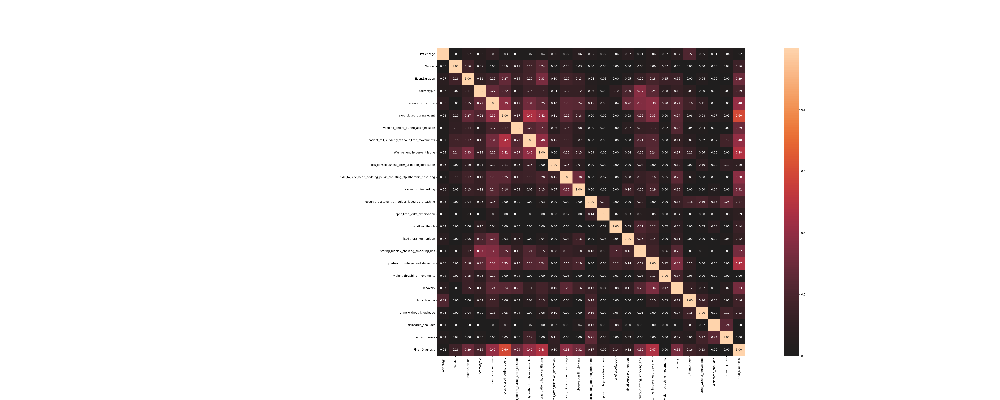

Final_Diagnosis                                                      1.000000
eyes_closed_during_event                                             0.599215
Was_patient_hyperventilating                                         0.482815
posturing_limbeyehead_deviation                                      0.474235
patient_fall_suddenly_without_limb_movements                         0.404282
events_occur_time                                                    0.402523
side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing    0.378964
recovery                                                             0.326129
staring_blankly_chewing_smacking_lips                                0.324035
observation_limbjerking                                              0.310874
EventDuration                                                        0.290785
weeping_before_during_after_episode                                  0.289621
Stereotypic                                                     

In [179]:
from dython.nominal import associations

complete_correlation= associations(df, filename= 'complete_correlation.png', figsize=(50,20))
complete_correlation['corr']['Final_Diagnosis'].abs().sort_values(ascending=False)

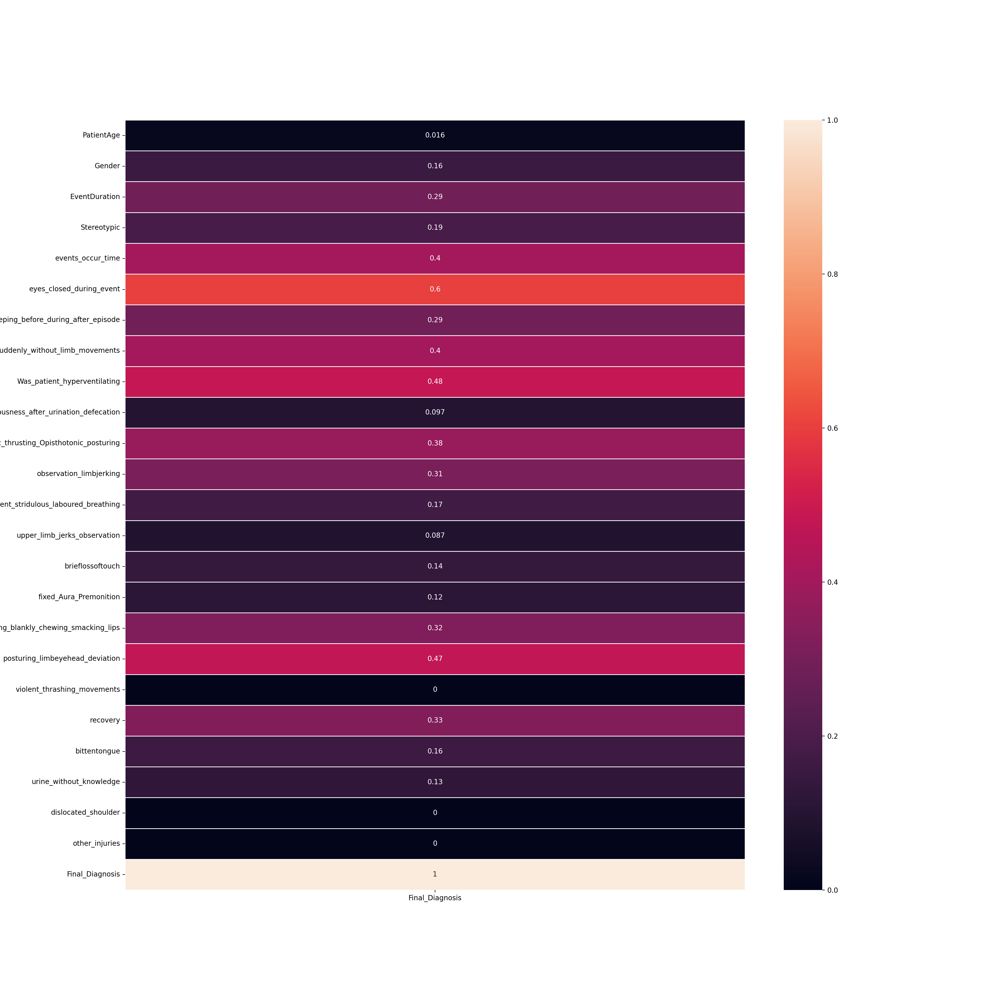

In [180]:
from pprint import pprint
# pprint(c_mat)
# c_mat['corr']

fig, ax = plt.subplots(figsize = (20,20))

columns = list(df)
result_cols = ['Final_Diagnosis']

for col in result_cols:
  columns.remove(col)

sns.heatmap(complete_correlation['corr'][result_cols], annot = True, linewidths = .5, ax = ax)
plt.show()

<Axes: title={'center': 'Final diagnosis'}>

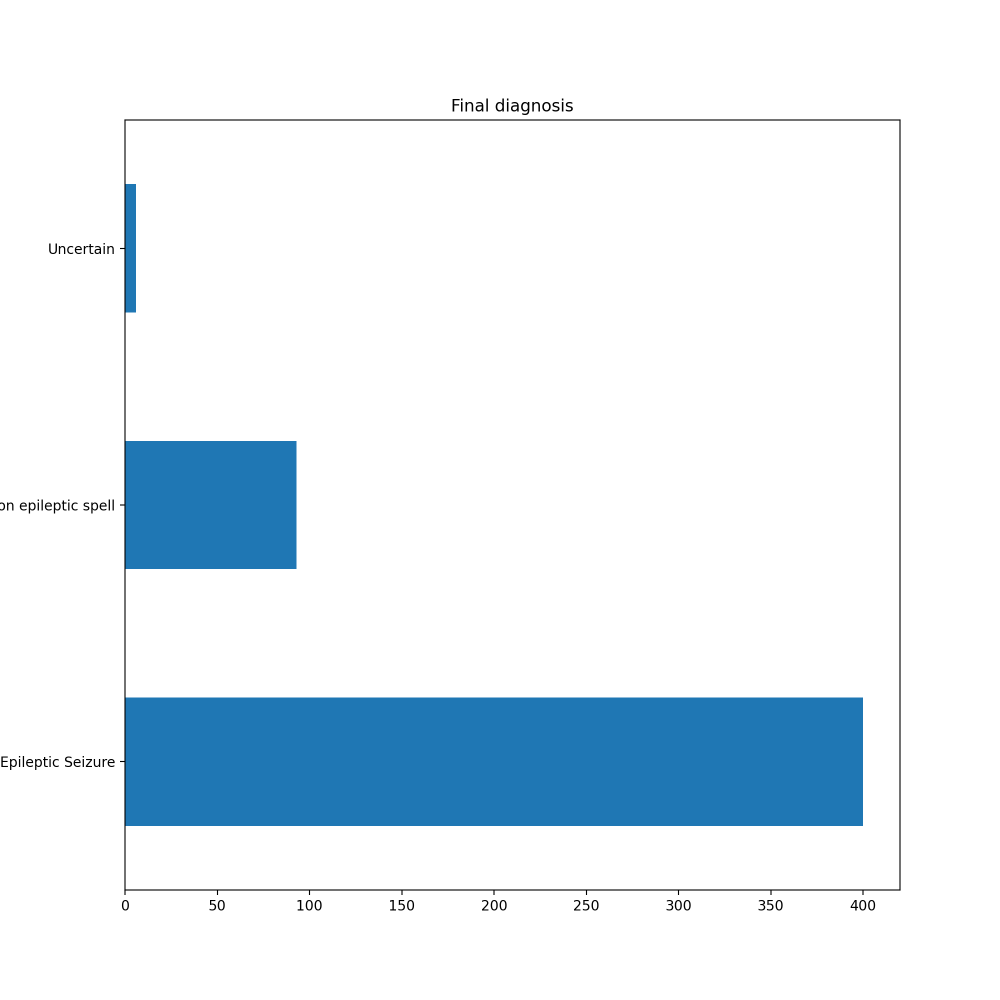

In [181]:
#checking for how many patients were epileptic/ uncertain/not epileptic
df['Final_Diagnosis'].value_counts().plot(kind='barh',title="Final diagnosis")

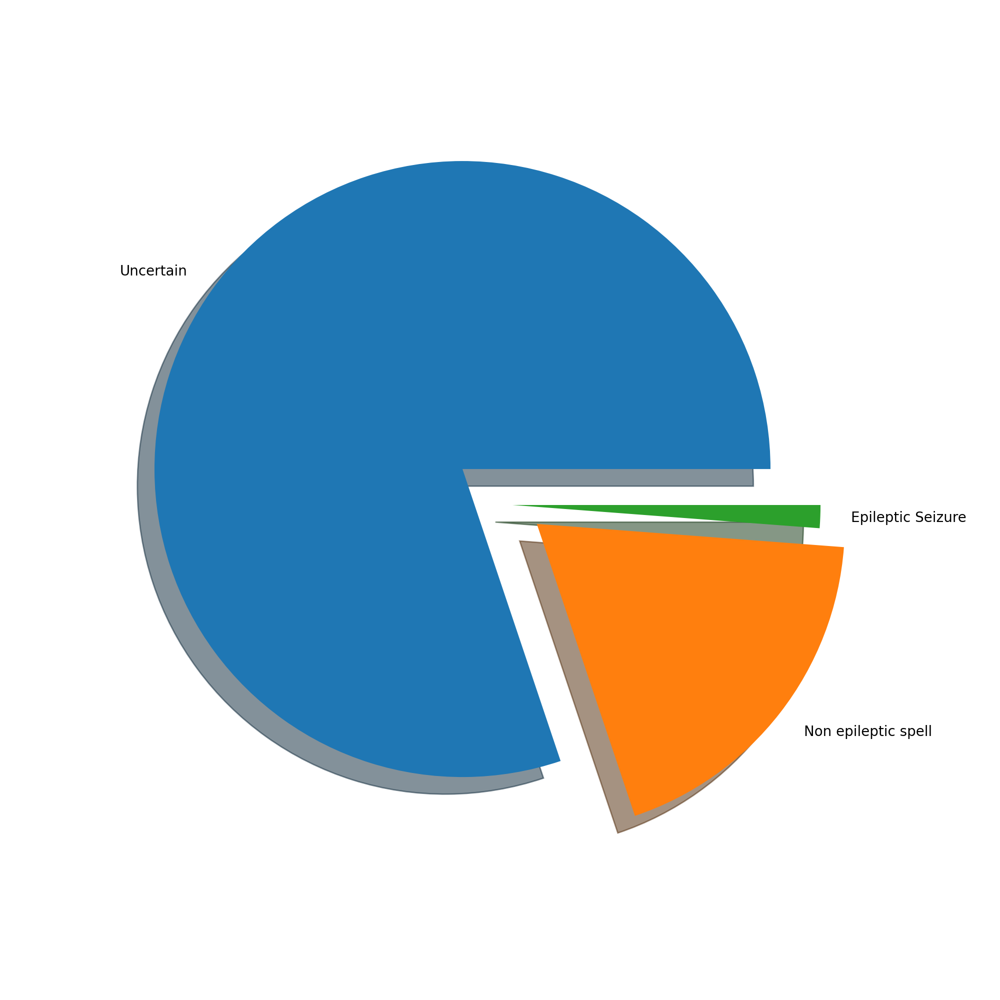

In [182]:
ss = df['Final_Diagnosis'].value_counts()
mylabels = ["Uncertain", "Non epileptic spell","Epileptic Seizure"]
myexplode = [0.2, 0.1, 0]
plt.pie(ss, labels = mylabels, explode = myexplode, shadow = True)

plt.show()

In [183]:
# observation list for the patients having answer yes or No
cols =list(df)

In [184]:
# results = (df
#     .melt(value_vars=cols)
#     .groupby(['variable', 'value'])
#     .agg({'value': 'count'})
#     .unstack()
#     .reset_index()
#     .droplevel(level=0, axis=1)
#     .assign(total = lambda x: x.sum(axis=1))
# )
# results

<Axes: title={'center': 'Recovery of the patients'}>

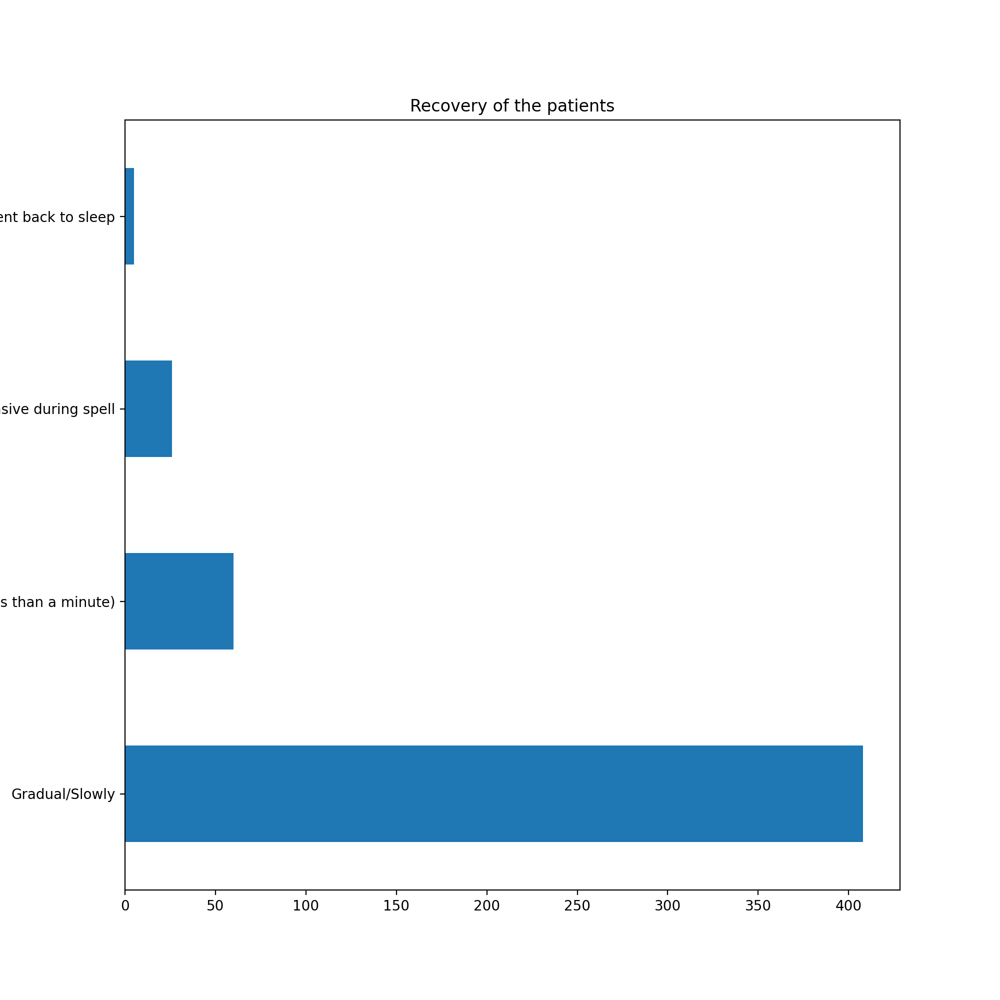

In [185]:
df['recovery'].value_counts().plot(kind='barh',title="Recovery of the patients")


<Axes: title={'center': 'bitter tongue status of the patients'}>

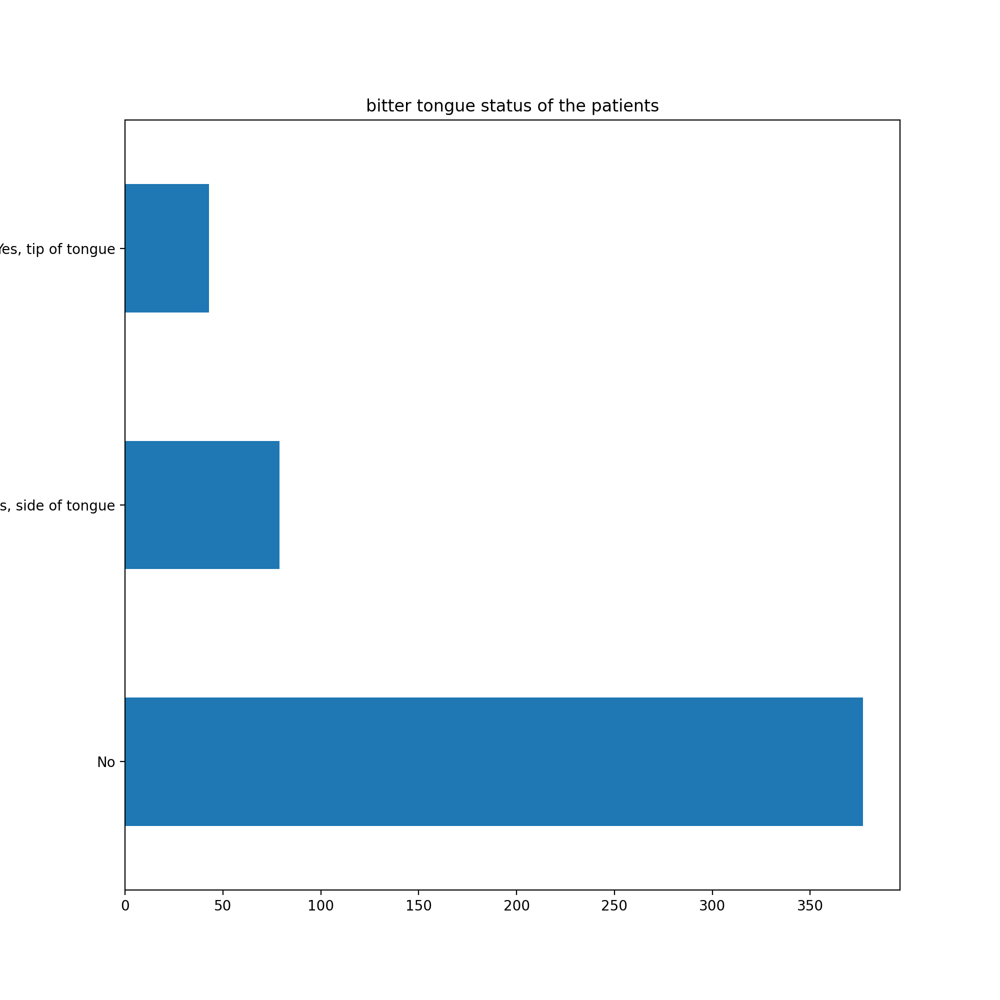

In [186]:
df['bittentongue'].value_counts().plot(kind='barh',title="bitter tongue status of the patients")


<Axes: title={'center': 'eyes closed during occurance of event'}>

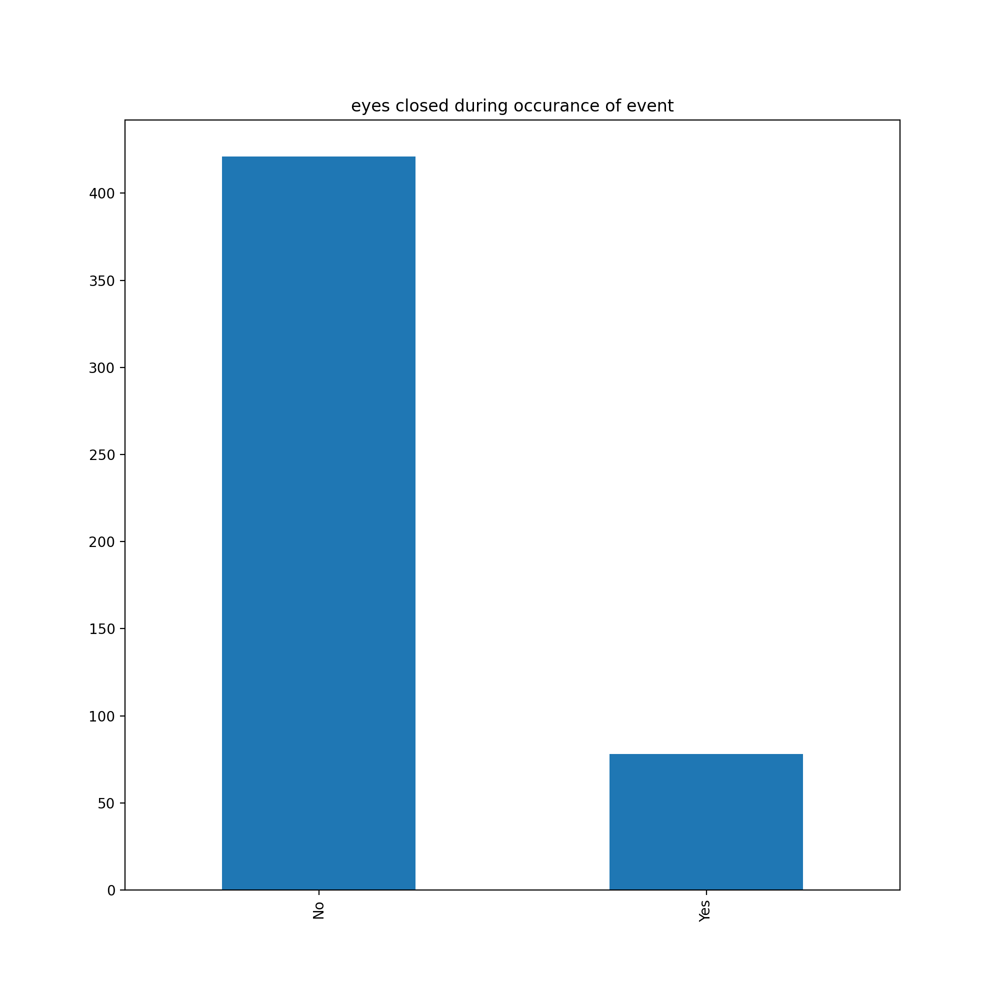

In [187]:
df['eyes_closed_during_event'].value_counts().plot(kind='bar',title="eyes closed during occurance of event")


<Axes: title={'center': 'weeping_before_during_after_episode'}>

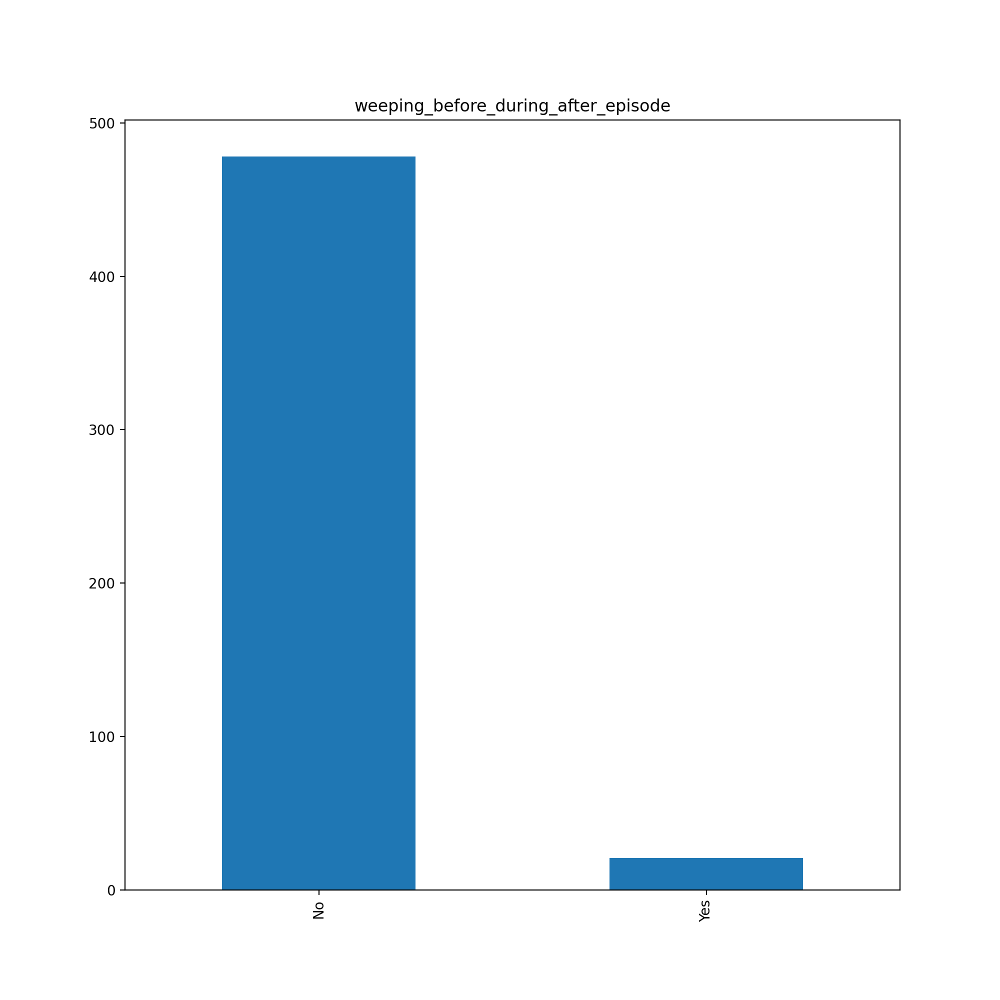

In [188]:
#checking for some observation of value yes/no
#df['wandering_headbanging_observation'].value_counts().plot(kind='bar',title="wandering movements or headbanging observation",color = "#4CAF50")
df['weeping_before_during_after_episode'].value_counts().plot(kind='bar',title="weeping_before_during_after_episode")

<Axes: title={'center': 'patient_fall_suddenly_without_limb_movements'}>

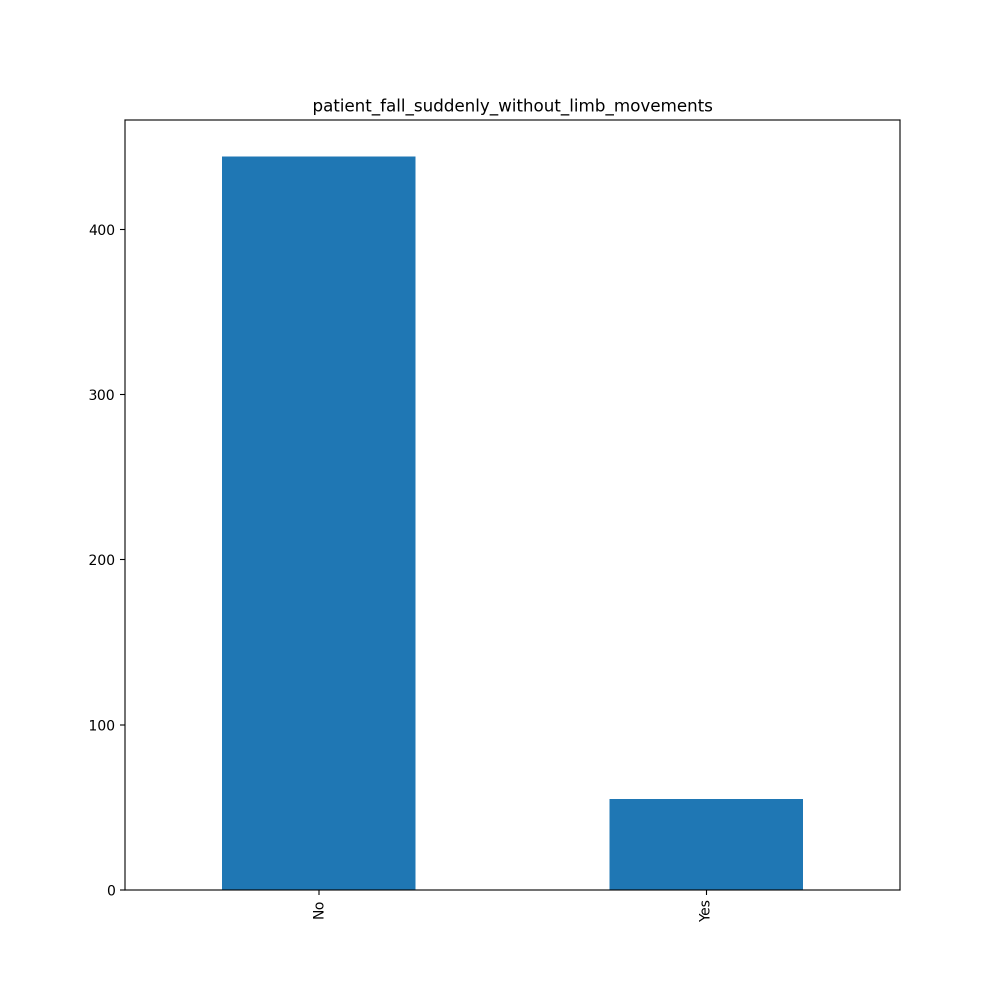

In [189]:
df['patient_fall_suddenly_without_limb_movements'].value_counts().plot(kind='bar',title="patient_fall_suddenly_without_limb_movements")

In [190]:
# # mapping to numerical value
# numeric_mappings = {}

# import string
# columns = list(df)
# columns=columns[1:]
# def replace():

#   for col in columns:
#     rowval=set()
#     for j in df[col]:
#       rowval.add(j)

#     enumval=[i for i in range(len(rowval))]
#     df[col].replace(list(rowval),enumval,inplace =True)
#     ind = 0
#     for rowvals in rowval:
#       numeric_mappings[rowvals] = enumval[ind]
#       ind+=1

# replace()
# df.head()


In [191]:
df.replace(np.nan, 0)
#making a deep copy of DF
#df_copy = df.copy(deep=True)
#df_copy

,PatientAge,Gender,EventDuration,Stereotypic,events_occur_time,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,...,fixed_Aura_Premonition,staring_blankly_chewing_smacking_lips,posturing_limbeyehead_deviation,violent_thrashing_movements,recovery,bittentongue,urine_without_knowledge,dislocated_shoulder,other_injuries,Final_Diagnosis
0,18.0,Female,More than 10 minutes,"Yes, all are same",Only during wakefulness,Yes,Yes,No,Yes,No,...,Yes,No,Yes,No,Gradual/Slowly,No,No,No,No,Non epileptic spell
1,26.0,Male,1-5 minutes,"Yes, all are same",Only during wakefulness,Yes,No,No,No,No,...,No,No,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
2,17.0,Male,5-10 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,No,No,Yes,No,Gradual/Slowly,No,No,No,Yes,Epileptic Seizure
3,40.0,Male,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,Yes,Yes,Yes,No,Abrupt/Sudden (less than a minute),No,No,No,Yes,Epileptic Seizure
4,17.0,Female,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,Yes,No,No,No,No,...,Yes,Yes,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,33.0,Male,1-5 minutes,Two different types (small ones and big ones),Both during wakefulness and sleep,No,No,No,No,No,...,Yes,No,Yes,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
495,30.0,Male,1-5 minutes,Two different types (small ones and big ones),Both during wakefulness and sleep,No,No,No,No,No,...,No,Yes,Yes,No,Gradual/Slowly,"Yes, side of tongue",No,No,No,Epileptic Seizure
496,22.0,Male,1-5 minutes,"Yes, all are same",Only in Sleep,No,No,No,No,No,...,No,No,Yes,No,Gradual/Slowly,"Yes, side of tongue",No,No,No,Epileptic Seizure
497,44.0,Male,1-5 minutes,Two different types (small ones and big ones),Both during wakefulness and sleep,No,No,No,No,No,...,Yes,Yes,Yes,No,Gradual/Slowly,"Yes, side of tongue",No,No,No,Epileptic Seizure


In [ ]:
#%pip install dython

In [192]:
import pandas as pd
from dython.nominal import associations
from dython.nominal import identify_nominal_columns
categorical_features=identify_nominal_columns(df)
categorical_features

['Gender',
 'EventDuration',
 'Stereotypic',
 'events_occur_time',
 'eyes_closed_during_event',
 'weeping_before_during_after_episode',
 'patient_fall_suddenly_without_limb_movements',
 'Was_patient_hyperventilating',
 'loss_consciousness_after_urination_defecation',
 'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing',
 'observation_limbjerking',
 'observe_postevent_stridulous_laboured_breathing',
 'upper_limb_jerks_observation',
 'brieflossoftouch',
 'fixed_Aura_Premonition',
 'staring_blankly_chewing_smacking_lips',
 'posturing_limbeyehead_deviation',
 'violent_thrashing_movements',
 'recovery',
 'bittentongue',
 'urine_without_knowledge',
 'dislocated_shoulder',
 'other_injuries',
 'Final_Diagnosis']

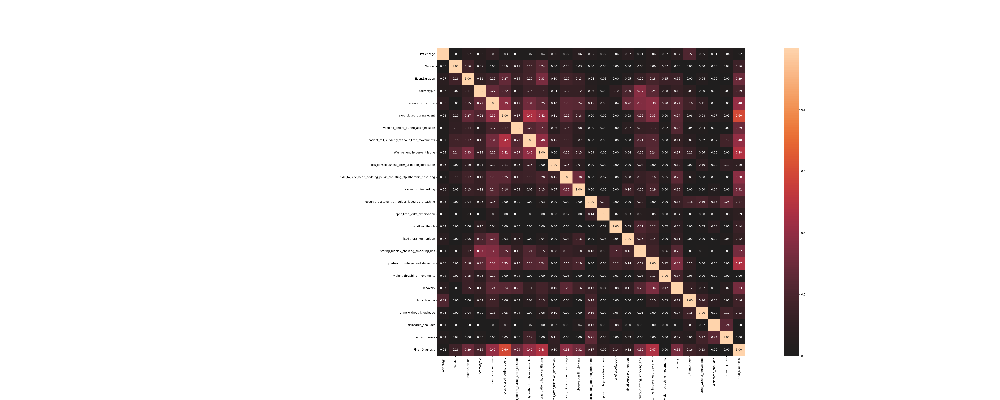

In [193]:
complete_correlation= associations(df, filename= 'complete_correlation.png', figsize=(50,20))

In [194]:
complete_correlation['corr']['Final_Diagnosis'].abs().sort_values(ascending=False)

Final_Diagnosis                                                      1.000000
eyes_closed_during_event                                             0.599215
Was_patient_hyperventilating                                         0.482815
posturing_limbeyehead_deviation                                      0.474235
patient_fall_suddenly_without_limb_movements                         0.404282
events_occur_time                                                    0.402523
side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing    0.378964
recovery                                                             0.326129
staring_blankly_chewing_smacking_lips                                0.324035
observation_limbjerking                                              0.310874
EventDuration                                                        0.290785
weeping_before_during_after_episode                                  0.289621
Stereotypic                                                     

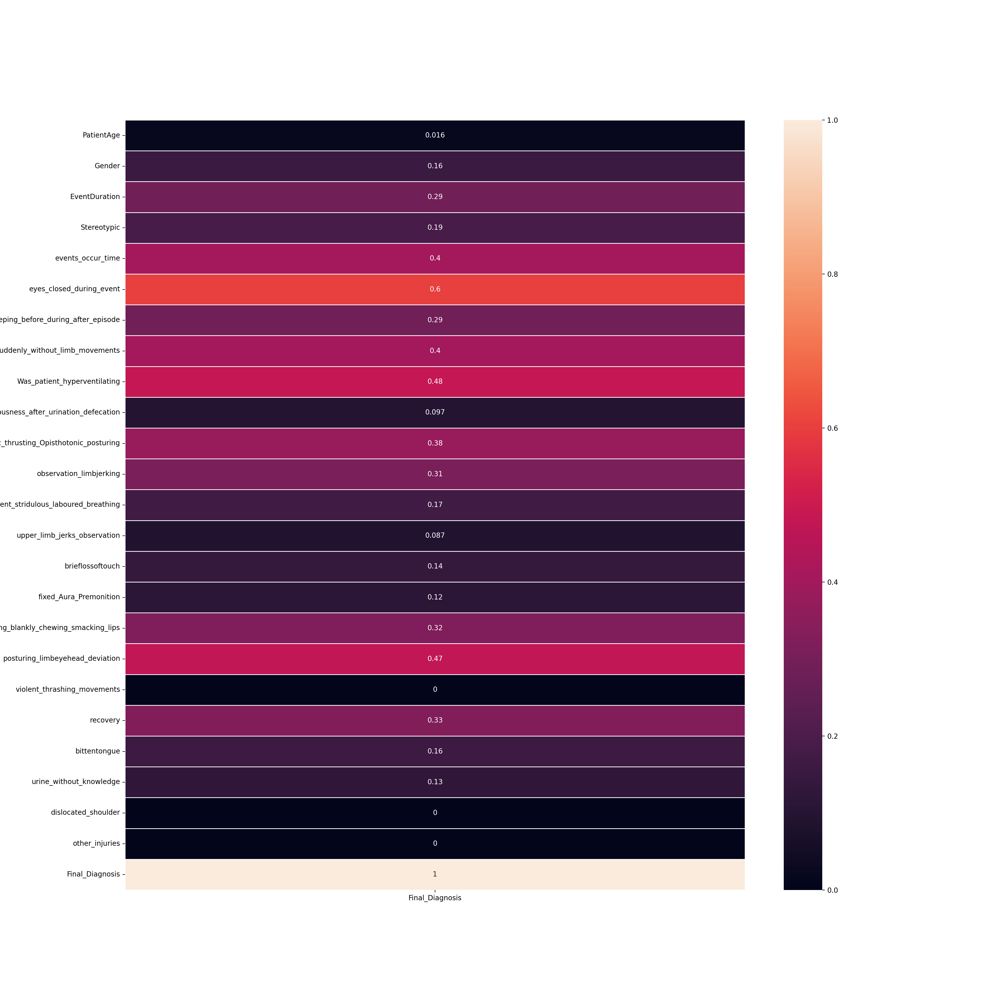

In [195]:
from pprint import pprint
# pprint(c_mat)
# c_mat['corr']

fig, ax = plt.subplots(figsize = (20,20))

columns = list(df)
result_cols = ['Final_Diagnosis']

for col in result_cols:
  columns.remove(col)

sns.heatmap(complete_correlation['corr'][result_cols], annot = True, linewidths = .5, ax = ax)
plt.show()

In [196]:
#removing starting case col
#df_copy.drop(df_copy.columns[0], axis=1, inplace=True)
#removing last 2 col
##df_copy.drop(df_copy.columns[len(df_copy.columns)-1], axis=1, inplace=True)
#print df_copy
#df_copy

In [197]:
df['Final_Diagnosis'].value_counts()

Epileptic Seizure      400
Non epileptic spell     93
Uncertain                6
Name: Final_Diagnosis, dtype: int64

In [198]:
#index of values with 0 (uncertain value)
f = df.loc[df['Final_Diagnosis'] == 'Uncertain'].index
f

Int64Index([369, 394, 421, 445, 455, 488], dtype='int64')

In [199]:
#remove 0 values
df.drop(f, inplace = True)
df

,PatientAge,Gender,EventDuration,Stereotypic,events_occur_time,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,...,fixed_Aura_Premonition,staring_blankly_chewing_smacking_lips,posturing_limbeyehead_deviation,violent_thrashing_movements,recovery,bittentongue,urine_without_knowledge,dislocated_shoulder,other_injuries,Final_Diagnosis
0,18.0,Female,More than 10 minutes,"Yes, all are same",Only during wakefulness,Yes,Yes,No,Yes,No,...,Yes,No,Yes,No,Gradual/Slowly,No,No,No,No,Non epileptic spell
1,26.0,Male,1-5 minutes,"Yes, all are same",Only during wakefulness,Yes,No,No,No,No,...,No,No,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
2,17.0,Male,5-10 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,No,No,Yes,No,Gradual/Slowly,No,No,No,Yes,Epileptic Seizure
3,40.0,Male,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,No,No,No,No,No,...,Yes,Yes,Yes,No,Abrupt/Sudden (less than a minute),No,No,No,Yes,Epileptic Seizure
4,17.0,Female,1-5 minutes,"Yes, all are same",Both during wakefulness and sleep,Yes,No,No,No,No,...,Yes,Yes,No,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,33.0,Male,1-5 minutes,Two different types (small ones and big ones),Both during wakefulness and sleep,No,No,No,No,No,...,Yes,No,Yes,No,Gradual/Slowly,No,No,No,No,Epileptic Seizure
495,30.0,Male,1-5 minutes,Two different types (small ones and big ones),Both during wakefulness and sleep,No,No,No,No,No,...,No,Yes,Yes,No,Gradual/Slowly,"Yes, side of tongue",No,No,No,Epileptic Seizure
496,22.0,Male,1-5 minutes,"Yes, all are same",Only in Sleep,No,No,No,No,No,...,No,No,Yes,No,Gradual/Slowly,"Yes, side of tongue",No,No,No,Epileptic Seizure
497,44.0,Male,1-5 minutes,Two different types (small ones and big ones),Both during wakefulness and sleep,No,No,No,No,No,...,Yes,Yes,Yes,No,Gradual/Slowly,"Yes, side of tongue",No,No,No,Epileptic Seizure


In [200]:
#storing df_copy to xl file in csv file
# from google.colab import files
# brandname = 'df_copy'
# df_copy.to_csv(brandname + '-subdirs_from_sitemap.csv', sep='\t')

In [201]:
# brandname = 'df_copy'
# files.download(brandname + '-subdirs_from_sitemap.csv')

In [202]:
#storing it in the google sheet
#Export to Google Sheets(Doing the Auth)
# !pip install --upgrade --quiet gspread
# from google.colab import auth
# auth.authenticate_user()

# import gspread
# #from oauth2client.client import GoogleCredentials
# from google.auth import default
# creds, _ = default()

# gc = gspread.authorize(creds)
#Export to Google Sheets / Part 2 Export
#!pip uninstall gspread-dataframe
# !pip install --upgrade --quiet gspread_dataframe
#pip install gspread_dataframe
# from gspread_dataframe import get_as_dataframe, set_with_dataframe

# sh = gc.create(brandname + '-subdirs_from_sitemap')
# worksheet = gc.open(brandname + '-subdirs_from_sitemap').sheet1

# set_with_dataframe(worksheet, df_copy)
# print(
#     p9.ggplot(df, p9.aes(x='events_occur_time', y='PatientAge')) +
#     p9.geom_point(p9.aes(color='Final_Diagnosis')) +
#     p9.theme_bw())

In [203]:
# one hot encoding

new_cols = dict()
old_cols = []

for col in df:
  unique = set()
  for entry in df[col]:
    unique.add(entry)
  if len(unique) > 2 and type(list(unique)[0]) != type(1.0):
    old_cols.append(col)
    for category in unique:
      col_name=col+" "+category
      new_cols[col_name] = []

      for entry in df[col]:
        if entry == category:
          new_cols[col_name].append('Yes')
        else:
          new_cols[col_name].append('No')

In [204]:
df.drop(old_cols, axis = 1,inplace=True)
for col_name in new_cols.keys():
  df[col_name] = new_cols[col_name]

In [205]:
df

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,events_occur_time Only during wakefulness,recovery Abrupt/Sudden (less than a minute),recovery Responsive during spell,recovery Didn’t recover went back to sleep,recovery Gradual/Slowly,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue",bittentongue No
0,18.0,Female,Yes,Yes,No,Yes,No,No,No,Yes,...,No,No,Yes,No,No,No,Yes,No,No,Yes
1,26.0,Male,Yes,No,No,No,No,No,No,No,...,No,No,Yes,No,No,No,Yes,No,No,Yes
2,17.0,Male,No,No,No,No,No,No,No,Yes,...,No,Yes,No,No,No,No,Yes,No,No,Yes
3,40.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,Yes,No,No,No,No,No,Yes
4,17.0,Female,Yes,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,33.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes
495,30.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,Yes,No
496,22.0,Male,No,No,No,No,No,No,No,No,...,Yes,No,No,No,No,No,Yes,No,Yes,No
497,44.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,Yes,No


In [206]:
df.to_excel('/content/Epilepsy after one hot encoding.xlsx')

In [207]:
from sklearn.model_selection import train_test_split

y= df.Final_Diagnosis
x=df.drop('Final_Diagnosis',axis=1)

#X_train, X_test, y_train, y_test = train_test_split(df_copy[X_cols], df_copy[Y_col],test_size=0.2, random_state=42)
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)
y

0      Non epileptic spell
1        Epileptic Seizure
2        Epileptic Seizure
3        Epileptic Seizure
4        Epileptic Seizure
              ...         
494      Epileptic Seizure
495      Epileptic Seizure
496      Epileptic Seizure
497      Epileptic Seizure
498    Non epileptic spell
Name: Final_Diagnosis, Length: 493, dtype: object

In [208]:
x_train

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,events_occur_time Only during wakefulness,recovery Abrupt/Sudden (less than a minute),recovery Responsive during spell,recovery Didn’t recover went back to sleep,recovery Gradual/Slowly,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue",bittentongue No
440,39.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes
56,24.0,Male,No,No,No,No,No,No,No,Yes,...,No,Yes,No,No,No,No,Yes,No,Yes,No
351,6.0,Female,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes
222,18.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,No,No,Yes,No,Yes,No
362,31.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,8.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes
270,68.0,Male,No,No,No,No,Yes,No,Yes,No,...,Yes,No,No,Yes,No,No,No,No,No,Yes
348,12.0,Female,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes
438,20.0,Female,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,Yes,No


In [209]:
x_test

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,events_occur_time Only during wakefulness,recovery Abrupt/Sudden (less than a minute),recovery Responsive during spell,recovery Didn’t recover went back to sleep,recovery Gradual/Slowly,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue",bittentongue No
459,53.0,Male,Yes,No,No,No,No,No,No,No,...,No,No,Yes,No,No,No,Yes,No,Yes,No
73,77.0,Male,No,No,No,No,No,No,No,Yes,...,Yes,No,No,No,No,No,Yes,No,No,Yes
310,13.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,No,No,Yes,No,No,Yes
175,13.0,Female,No,No,Yes,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes
332,9.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,No,No,Yes,No,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15,12.0,Female,No,No,No,No,No,No,No,Yes,...,No,No,Yes,No,No,No,Yes,No,No,Yes
405,30.0,Male,No,No,No,No,No,No,No,No,...,No,No,Yes,No,No,No,Yes,No,No,Yes
381,12.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes
19,32.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes


In [210]:
y_train

440      Epileptic Seizure
56       Epileptic Seizure
351      Epileptic Seizure
222      Epileptic Seizure
362      Epileptic Seizure
              ...         
106      Epileptic Seizure
270      Epileptic Seizure
348      Epileptic Seizure
438      Epileptic Seizure
102    Non epileptic spell
Name: Final_Diagnosis, Length: 394, dtype: object

In [211]:
y_test

459    Epileptic Seizure
73     Epileptic Seizure
310    Epileptic Seizure
175    Epileptic Seizure
332    Epileptic Seizure
             ...        
15     Epileptic Seizure
405    Epileptic Seizure
381    Epileptic Seizure
19     Epileptic Seizure
446    Epileptic Seizure
Name: Final_Diagnosis, Length: 99, dtype: object

In [212]:
#from google.colab import files
#uploaded = files.upload()
#from google.colab import drive
#drive.mount('/content/drive')
#path = "https://docs.google.com/spreadsheets/d/1w_Cv0-Hjal9KMStRTuLkPOc2JOfCAk-q6rKRisgArAY/edit?usp=sharing"
#df_bonus = pd.read_csv(path)
#df_bonus


In [213]:
df

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,events_occur_time Only during wakefulness,recovery Abrupt/Sudden (less than a minute),recovery Responsive during spell,recovery Didn’t recover went back to sleep,recovery Gradual/Slowly,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue",bittentongue No
0,18.0,Female,Yes,Yes,No,Yes,No,No,No,Yes,...,No,No,Yes,No,No,No,Yes,No,No,Yes
1,26.0,Male,Yes,No,No,No,No,No,No,No,...,No,No,Yes,No,No,No,Yes,No,No,Yes
2,17.0,Male,No,No,No,No,No,No,No,Yes,...,No,Yes,No,No,No,No,Yes,No,No,Yes
3,40.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,Yes,No,No,No,No,No,Yes
4,17.0,Female,Yes,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,33.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,No,Yes
495,30.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,Yes,No
496,22.0,Male,No,No,No,No,No,No,No,No,...,Yes,No,No,No,No,No,Yes,No,Yes,No
497,44.0,Male,No,No,No,No,No,No,No,No,...,No,Yes,No,No,No,No,Yes,No,Yes,No


In [42]:
# #%pip install statsmodels --upgrade
# !pip show matplotlib   #enables you to check version
# !pip install matplotlib==3.5

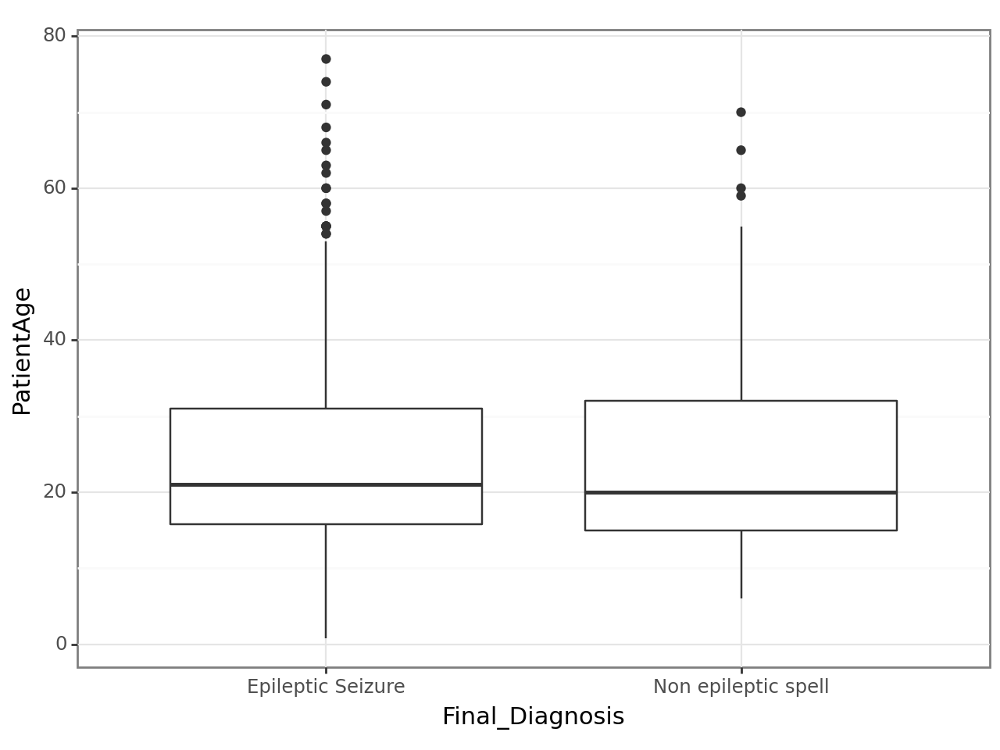

In [214]:
import plotnine as p9

print(
    p9.ggplot(df, p9.aes(x='Final_Diagnosis', y='PatientAge')) +
    p9.geom_boxplot() +
    p9.theme_bw())

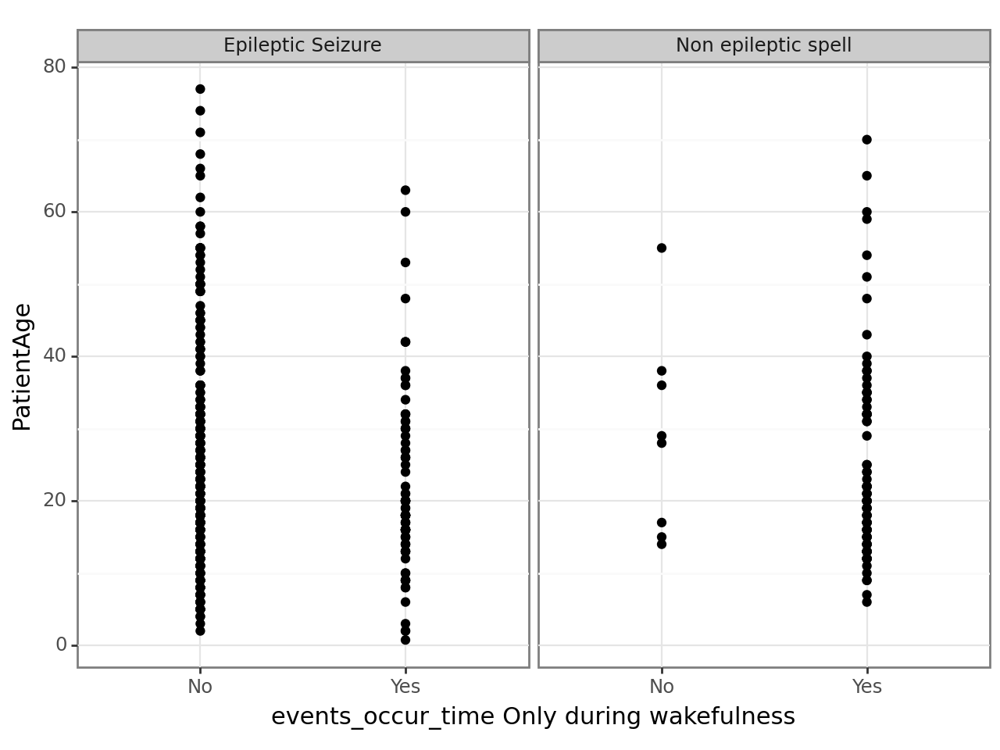

In [215]:
print(
    p9.ggplot(df, p9.aes(x='events_occur_time Only during wakefulness', y='PatientAge')) +
    p9.geom_point() +
    p9.facet_wrap('~ Final_Diagnosis') +
    p9.theme_bw())

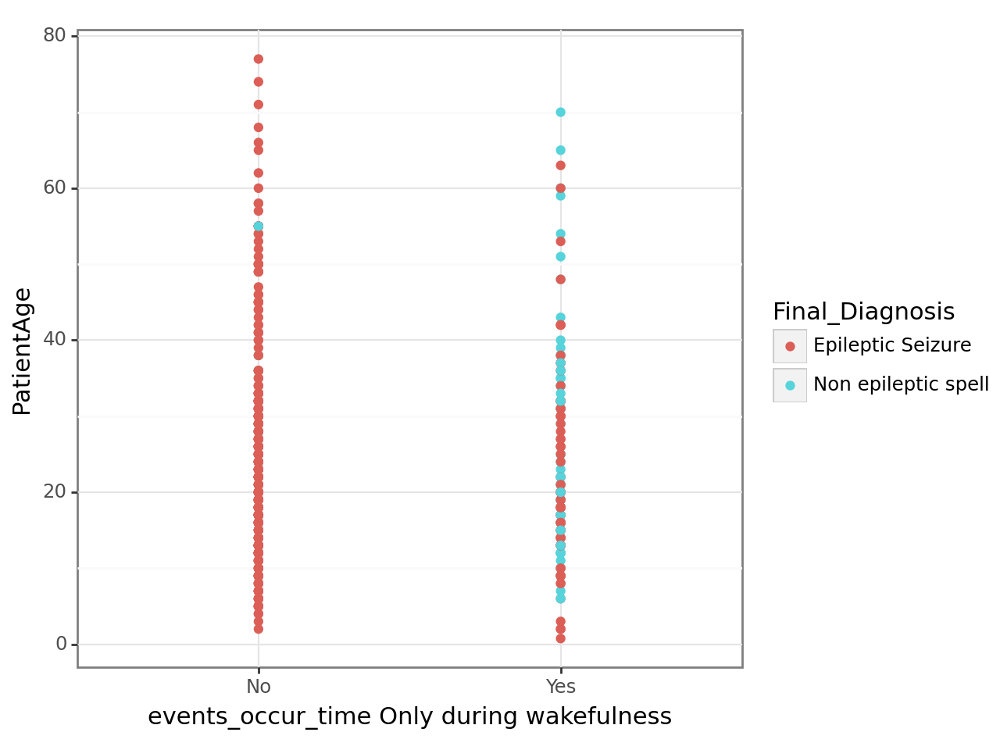

In [216]:
print(
    p9.ggplot(df, p9.aes(x='events_occur_time Only during wakefulness', y='PatientAge')) +
    p9.geom_point(p9.aes(color='Final_Diagnosis')) +
    p9.theme_bw())

In [217]:
print(x_train['PatientAge'].dtype)

cat_cols = []
for col in x_train.columns:
    if col!='PatientAge':
        cat_cols.append(True)
    else:
      cat_cols.append(False)


float64


In [218]:

# import SMOTE module from imblearn library
# pip install imblearn (if you don't have imblearn in your systhem)
!pip install --upgrade --quiet imblearn
from imblearn.over_sampling import SMOTENC

sm = SMOTENC( categorical_features = cat_cols, random_state = 10)
x_train_smote, y_train_smote = sm.fit_resample(x_train, y_train.ravel())


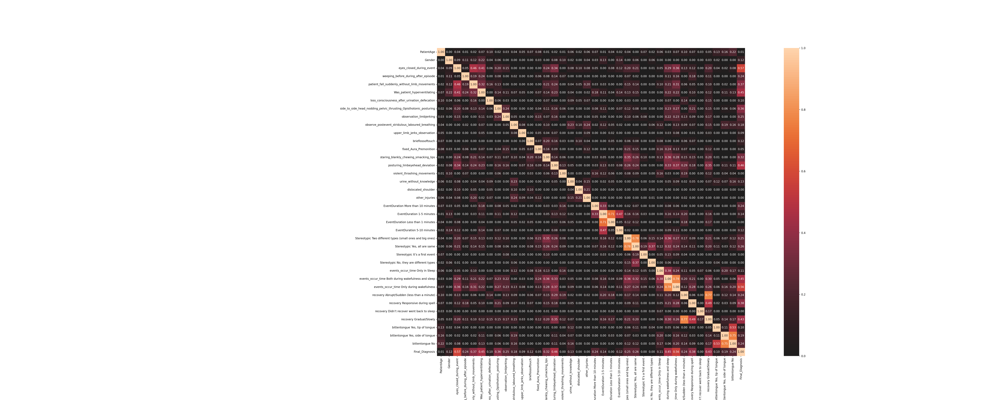

In [219]:
x_original = x_train.copy()
x_original['Final_Diagnosis'] = y_train.tolist()
correlations = {}
complete_correlation= associations(x_original, filename= 'complete_correlation.png', figsize=(50,20))

correlations['original'] = (complete_correlation['corr']["Final_Diagnosis"].abs().copy())

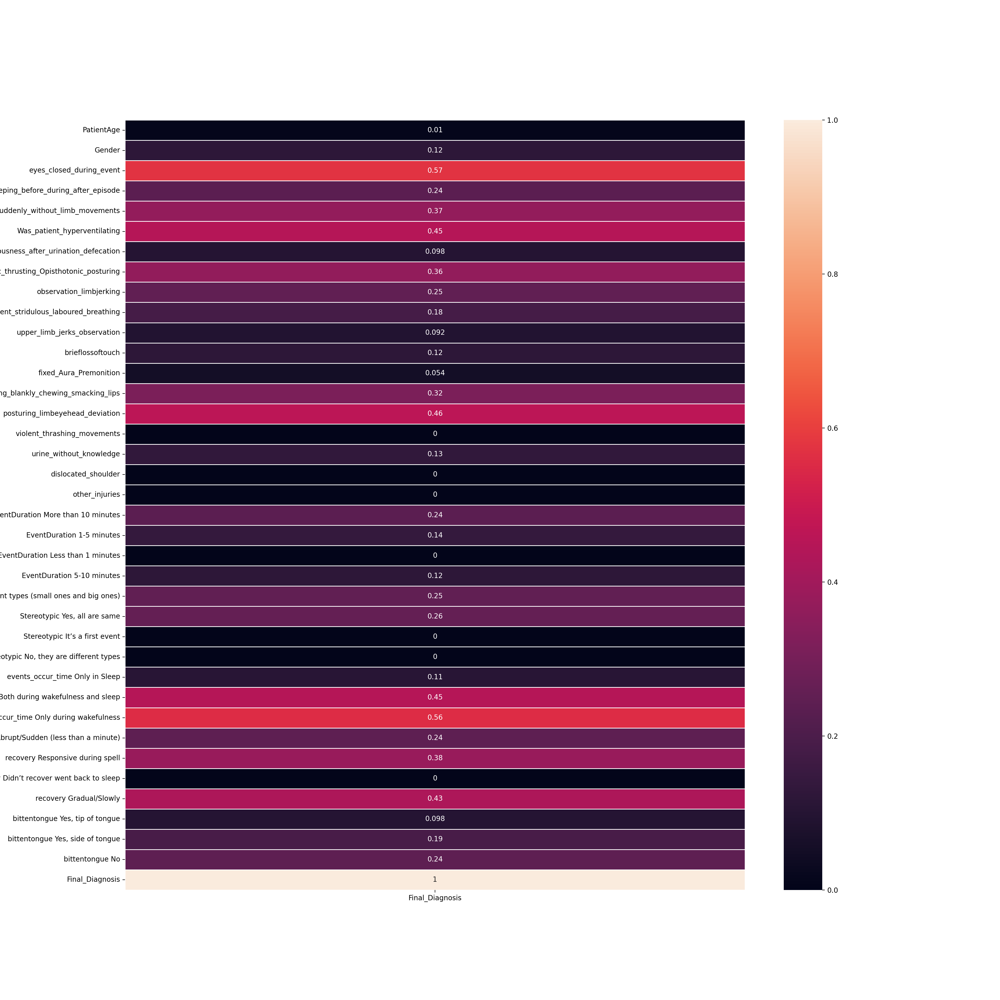

In [220]:
from pprint import pprint
# pprint(c_mat)
# c_mat['corr']

fig, ax = plt.subplots(figsize = (20,20))

columns = list(df)
result_cols = ['Final_Diagnosis']

for col in result_cols:
  columns.remove(col)

sns.heatmap(complete_correlation['corr'][result_cols], annot = True, linewidths = .5, ax = ax)
plt.show()

In [221]:
cor_mp = complete_correlation['corr']["Final_Diagnosis"].abs().sort_values(ascending=False)

Index(['Final_Diagnosis', 'eyes_closed_during_event',
       'events_occur_time Only during wakefulness',
       'posturing_limbeyehead_deviation', 'Was_patient_hyperventilating',
       'events_occur_time Both during wakefulness and sleep',
       'recovery Gradual/Slowly', 'recovery Responsive during spell',
       'patient_fall_suddenly_without_limb_movements',
       'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing',
       'staring_blankly_chewing_smacking_lips',
       'Stereotypic Yes, all are same', 'observation_limbjerking',
       'Stereotypic Two different types (small ones and big ones)',
       'recovery Abrupt/Sudden (less than a minute)', 'bittentongue No',
       'EventDuration More than 10 minutes',
       'weeping_before_during_after_episode',
       'bittentongue Yes, side of tongue',
       'observe_postevent_stridulous_laboured_breathing',
       'EventDuration 1-5 minutes', 'urine_without_knowledge',
       'brieflossoftouch', 'Gender', 'EventDur

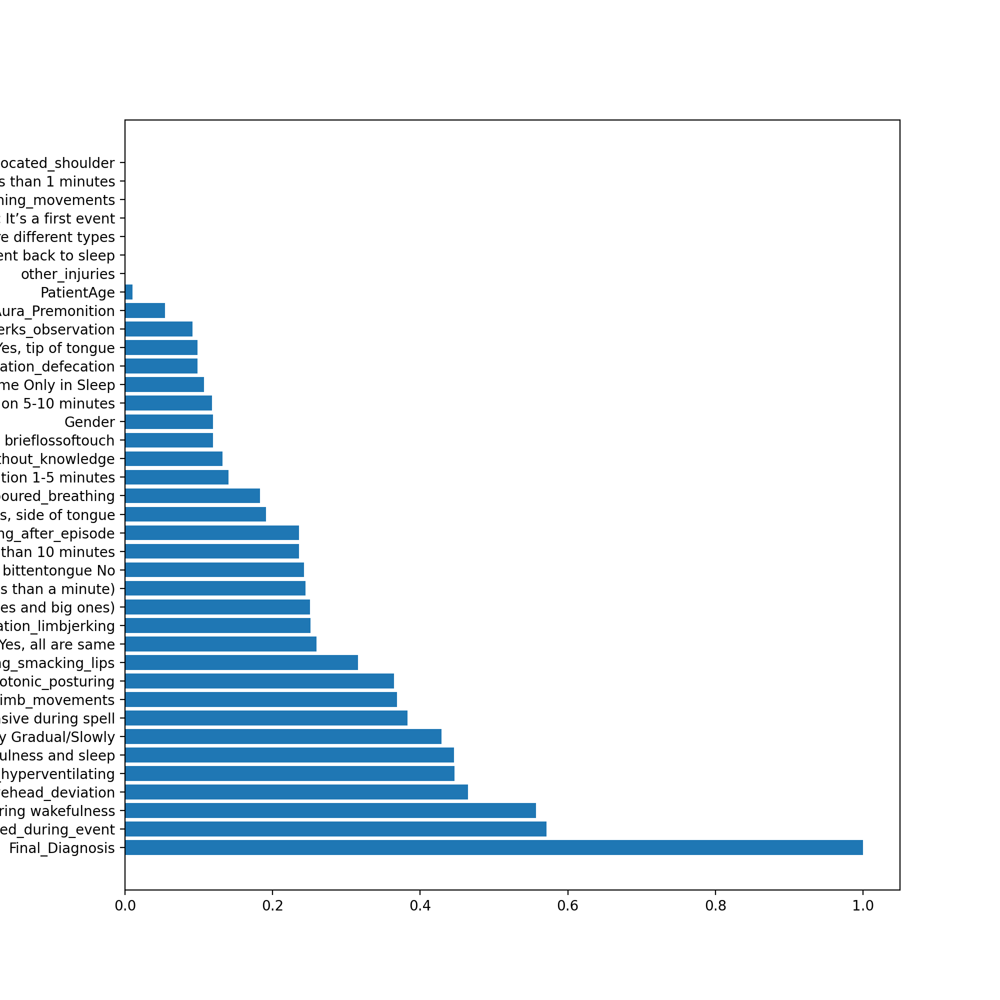

In [222]:
feature = cor_mp.keys()

print(feature)

plt.barh([feature[i] for i in range(len(feature))], cor_mp)
plt.rcParams['figure.figsize'] = [10, 11]
plt.show()

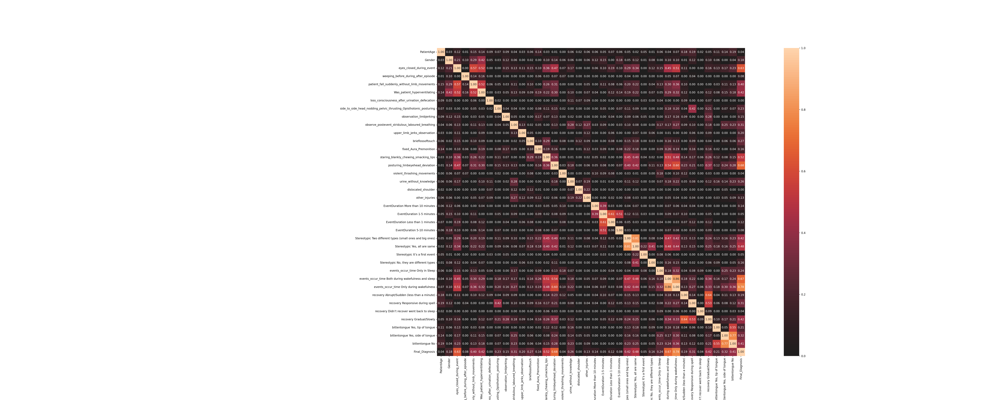

In [223]:
x_corr = x_train_smote.copy()
x_corr['Final_Diagnosis'] = y_train_smote.tolist()

complete_correlation= associations(x_corr, filename= 'complete_correlation.png', figsize=(50,20))
correlations['smote'] =(complete_correlation['corr']["Final_Diagnosis"].abs().copy())

In [224]:
cor_mp = complete_correlation['corr']["Final_Diagnosis"].abs().sort_values(ascending=False)

In [225]:
cor_mp

Final_Diagnosis                                                      1.000000
events_occur_time Only during wakefulness                            0.777669
posturing_limbeyehead_deviation                                      0.679274
events_occur_time Both during wakefulness and sleep                  0.673595
eyes_closed_during_event                                             0.632433
staring_blankly_chewing_smacking_lips                                0.519320
Stereotypic Yes, all are same                                        0.479388
recovery Gradual/Slowly                                              0.420315
Was_patient_hyperventilating                                         0.417192
Stereotypic Two different types (small ones and big ones)            0.416933
bittentongue No                                                      0.406489
patient_fall_suddenly_without_limb_movements                         0.404615
bittentongue Yes, side of tongue                                

Index(['Final_Diagnosis', 'events_occur_time Only during wakefulness',
       'posturing_limbeyehead_deviation',
       'events_occur_time Both during wakefulness and sleep',
       'eyes_closed_during_event', 'staring_blankly_chewing_smacking_lips',
       'Stereotypic Yes, all are same', 'recovery Gradual/Slowly',
       'Was_patient_hyperventilating',
       'Stereotypic Two different types (small ones and big ones)',
       'bittentongue No', 'patient_fall_suddenly_without_limb_movements',
       'bittentongue Yes, side of tongue',
       'observe_postevent_stridulous_laboured_breathing',
       'recovery Responsive during spell', 'brieflossoftouch',
       'urine_without_knowledge', 'events_occur_time Only in Sleep',
       'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing',
       'bittentongue Yes, tip of tongue', 'upper_limb_jerks_observation',
       'recovery Abrupt/Sudden (less than a minute)', 'Gender',
       'Stereotypic No, they are different types', 'fi

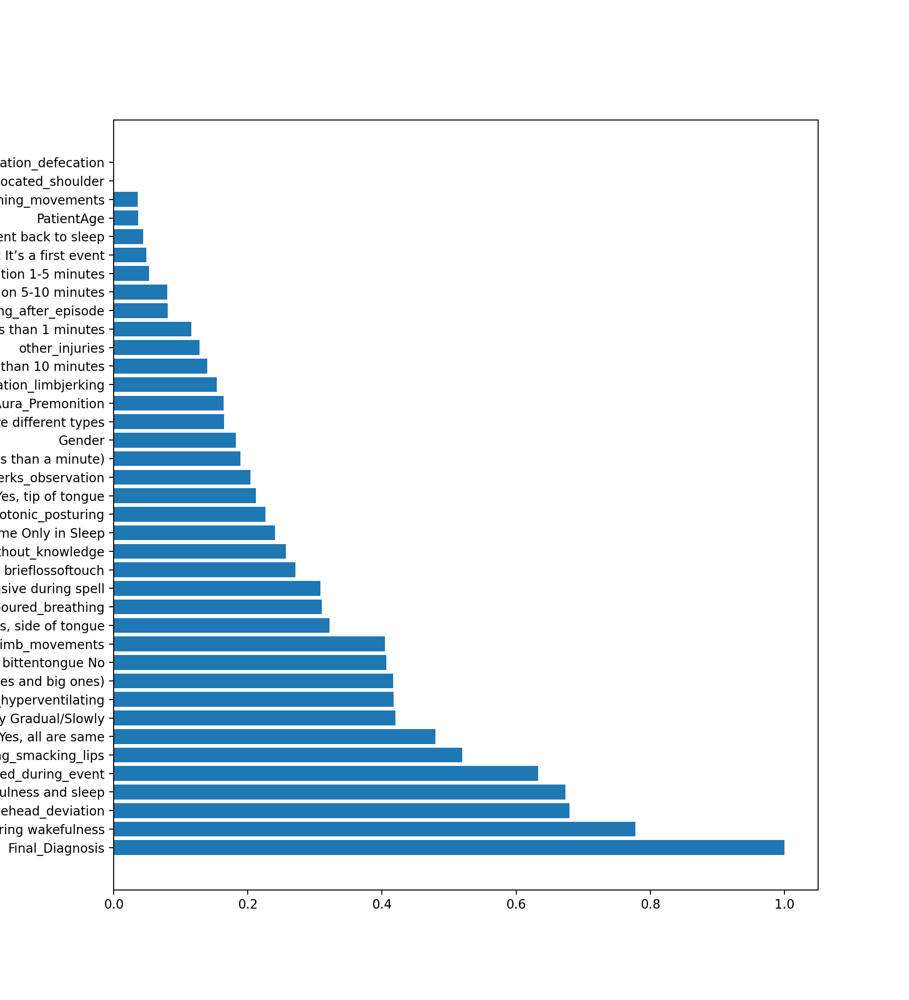

In [226]:
feature = cor_mp.keys()

print(feature)

plt.barh([feature[i] for i in range(len(feature))], cor_mp)
plt.rcParams['figure.figsize'] = [10, 11]
plt.show()

In [227]:
compare_original_smote = dict()

for k in correlations['original'].keys():
  compare_original_smote[k] = [correlations['original'][k]]

for k in correlations['smote'].keys():
  compare_original_smote[k].append(correlations['smote'][k])


In [ ]:
# ask if age is relevant

In [228]:
less_correlation = []

for k in correlations['smote'].keys():
  if correlations['smote'][k] < 0.05:
    less_correlation.append(k)

print(less_correlation)

['PatientAge', 'loss_consciousness_after_urination_defecation', 'violent_thrashing_movements', 'dislocated_shoulder', 'Stereotypic It’s a first event', 'recovery Didn’t recover went back to sleep']


In [229]:
# x_corr = x_train_smote.copy()
# x_corr['Final_Diagnosis'] = y_train_smote

# complete_correlation= associations(x_corr, filename= 'complete_correlation.png', figsize=(50,20))
# correlations['smote'] =(complete_correlation['corr']["Final_Diagnosis"].abs())

<Axes: title={'center': 'patient_fall_suddenly_without_limb_movements'}>

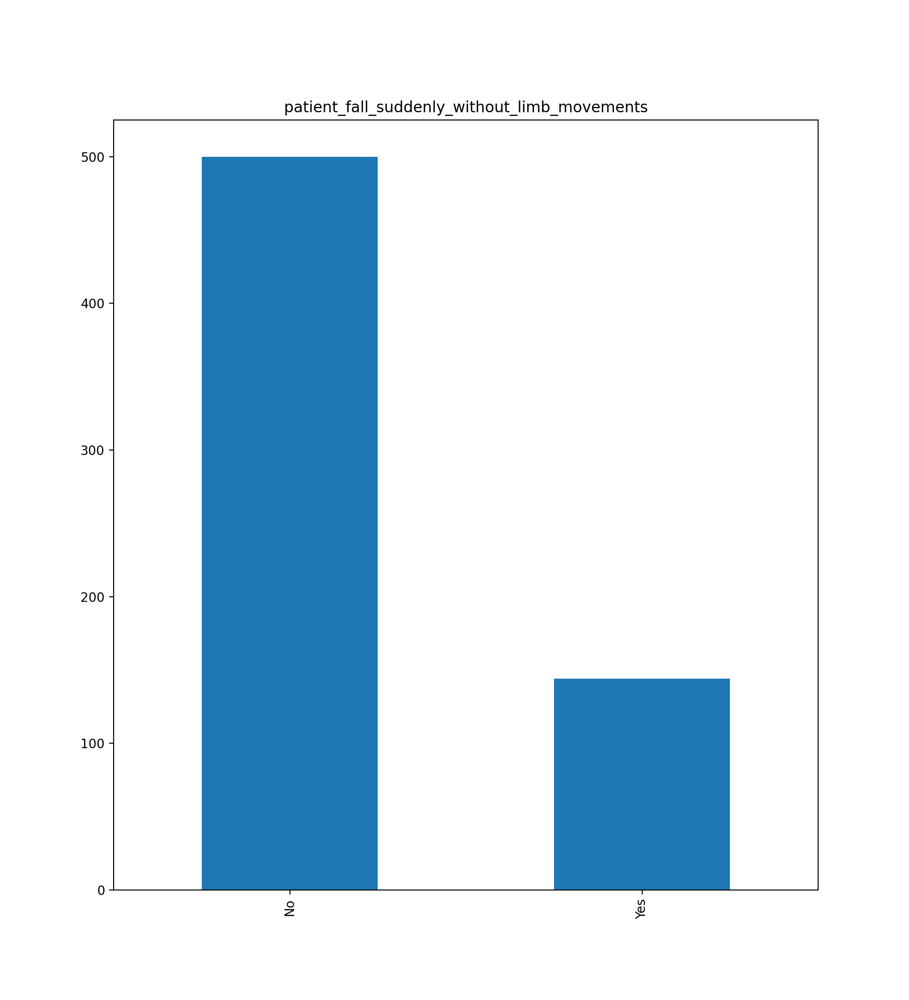

In [230]:
x_corr['patient_fall_suddenly_without_limb_movements'].value_counts().plot(kind='bar',title="patient_fall_suddenly_without_limb_movements")


<Axes: title={'center': 'weeping_before_during_after_episode'}>

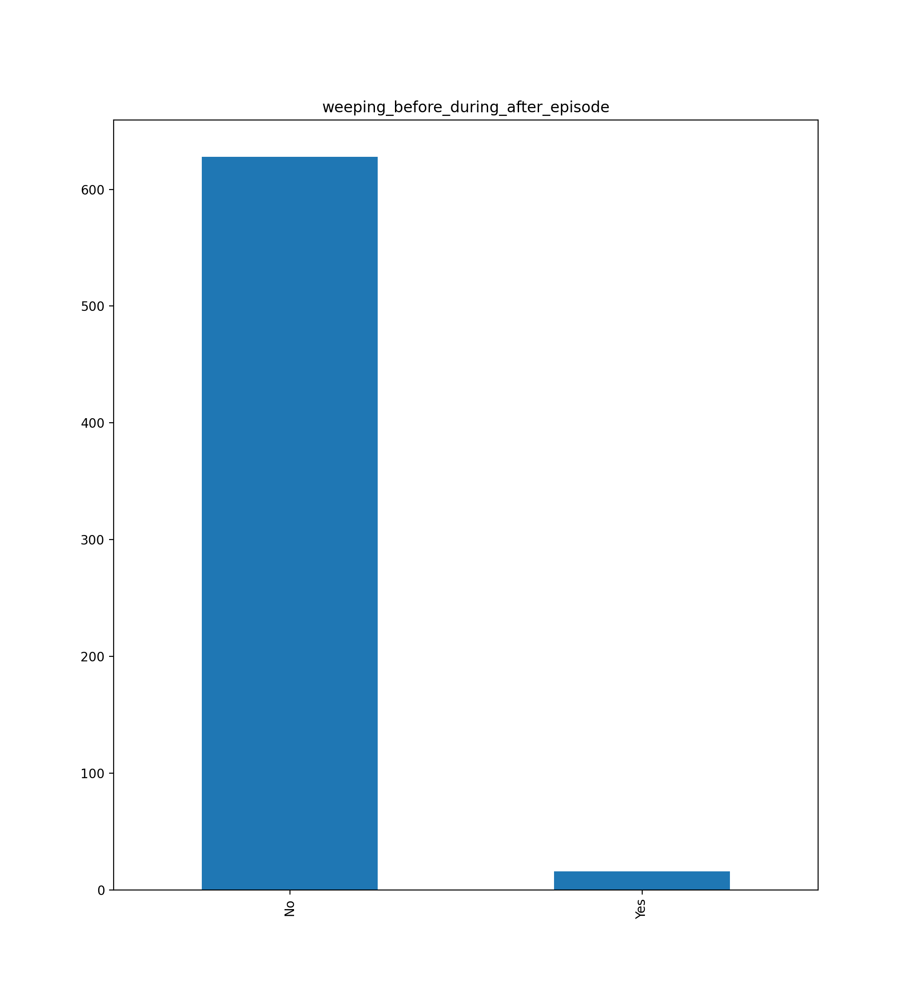

In [231]:
x_corr['weeping_before_during_after_episode'].value_counts().plot(kind='bar',title="weeping_before_during_after_episode")


In [60]:
#x_corr['wandering_headbanging_observation'].value_counts().plot(kind='bar',title="wandering movements or headbanging observation",color = "#4CAF50")


<Axes: title={'center': 'eyes closed during occurance of event'}>

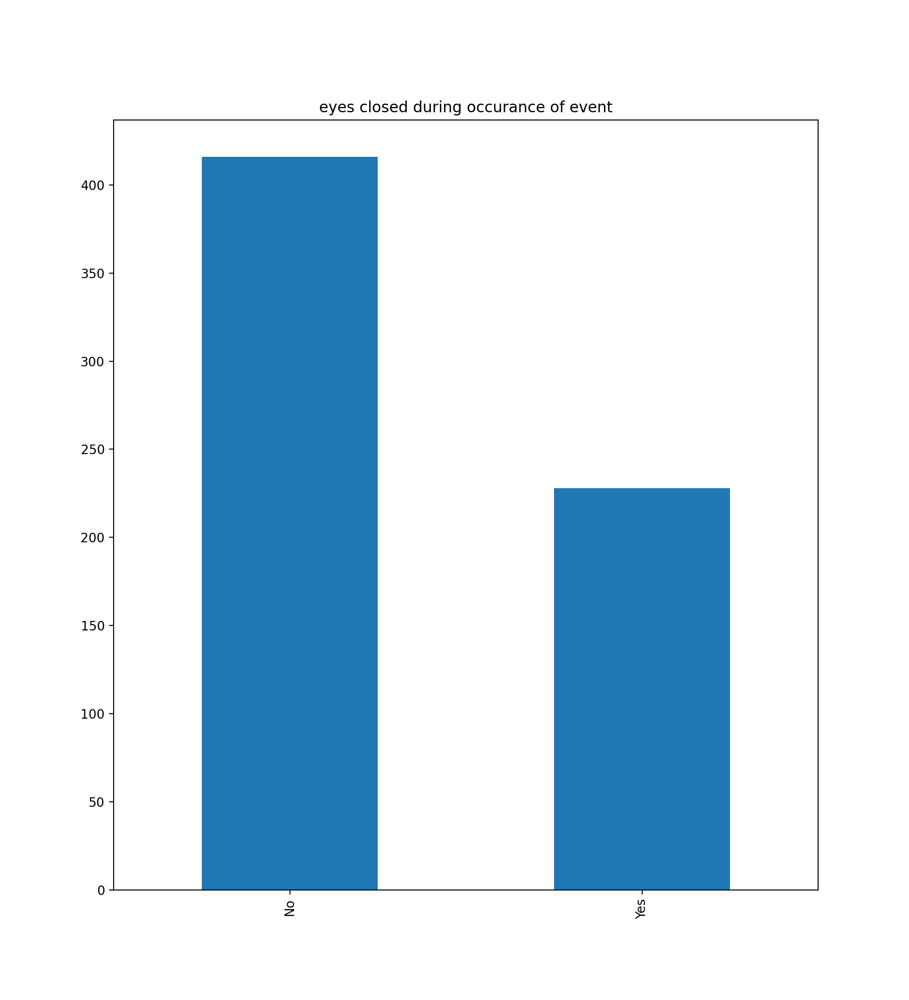

In [232]:
x_corr['eyes_closed_during_event'].value_counts().plot(kind='bar',title="eyes closed during occurance of event")


<Axes: title={'center': 'bitter tongue status of the patients'}>

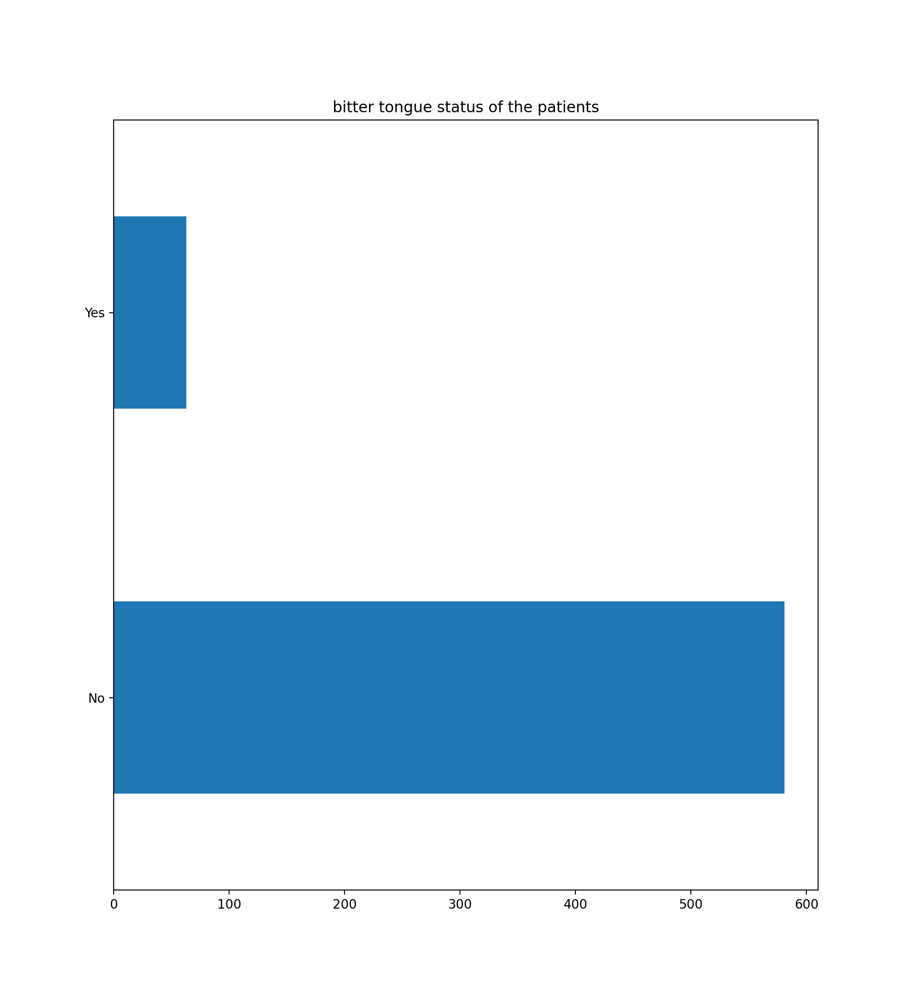

In [233]:
x_corr['bittentongue Yes, side of tongue'].value_counts().plot(kind='barh',title="bitter tongue status of the patients")


<Axes: title={'center': 'Recovery of the patients'}>

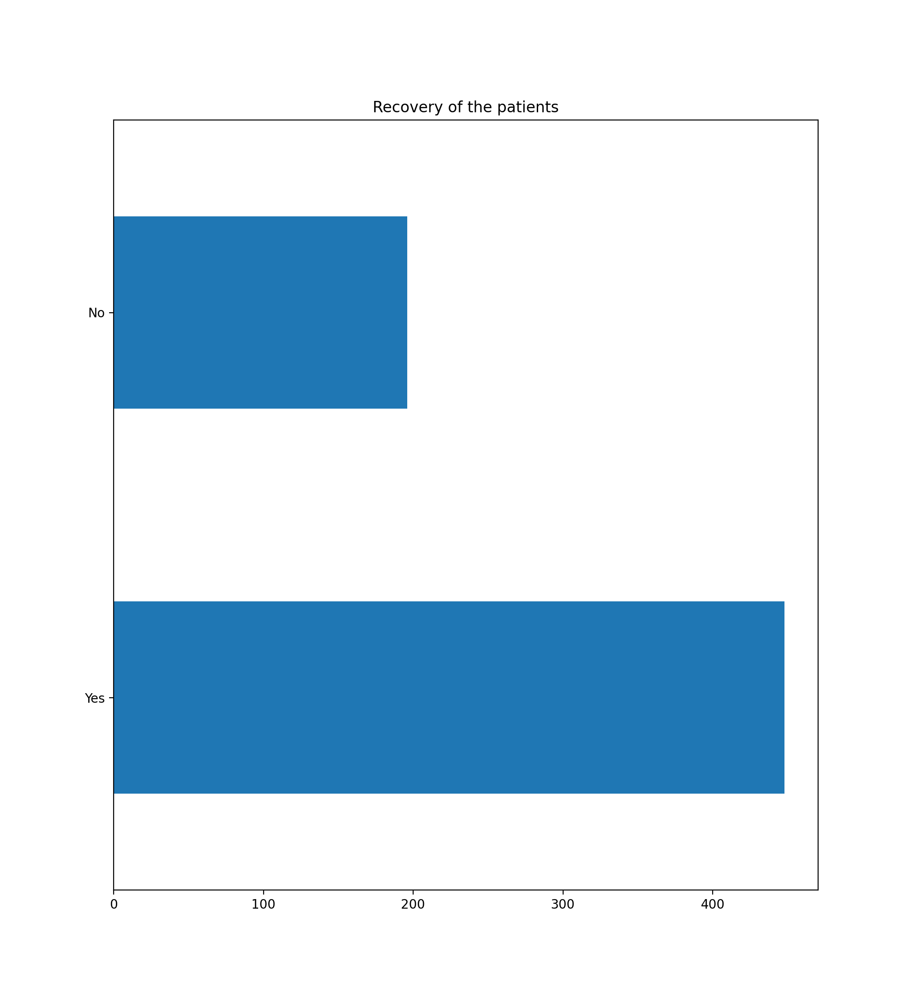

In [234]:
x_corr['recovery Gradual/Slowly'].value_counts().plot(kind='barh',title="Recovery of the patients")

<Axes: title={'center': 'Final Diagnosis'}>

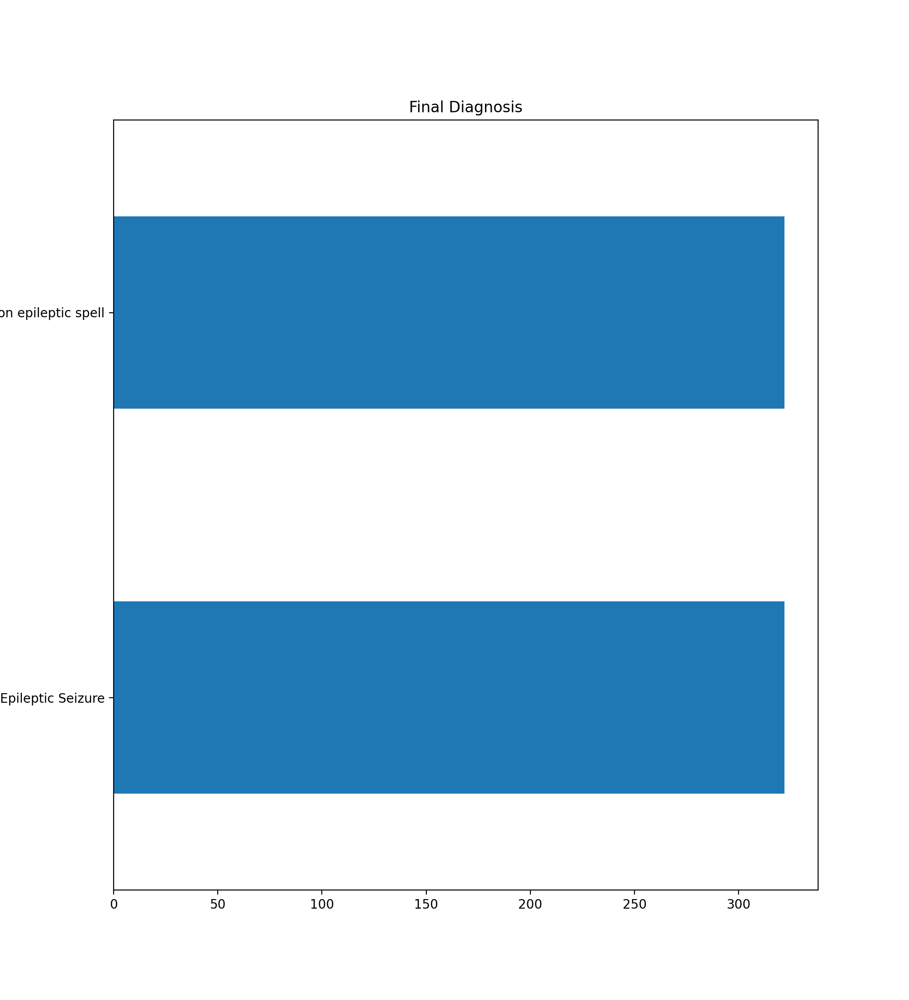

In [235]:
x_corr['Final_Diagnosis'].value_counts().plot(kind='barh',title="Final Diagnosis")

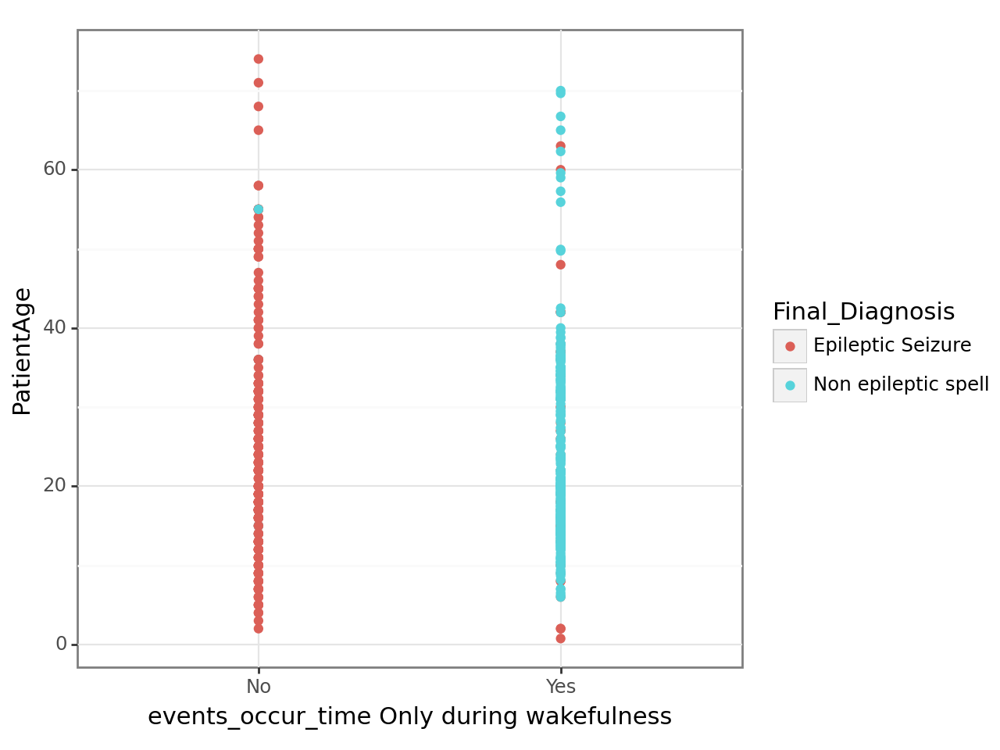

In [236]:
print(
    p9.ggplot(x_corr, p9.aes(x='events_occur_time Only during wakefulness', y='PatientAge')) +
    p9.geom_point(p9.aes(color='Final_Diagnosis')) +
    p9.theme_bw())

In [237]:
#mapping xtraining data
import string

numeric_col=['PatientAge']

numeric_mappings = {}
columns = list(x_train)

#print(columns)
for c in numeric_col:
  if c in columns:
    columns.remove(c)

for col in columns:
  rowval=set()
  for j in x_train[col]:
    rowval.add(j)

  enumval=[k for k in range(len(rowval))]
  x_train[col].replace(list(rowval),enumval,inplace =True)
  x_train_smote[col].replace(list(rowval),enumval,inplace =True)
  x_test[col].replace(list(rowval),enumval,inplace =True)

  ind = 0
  for rowvals in rowval:
    numeric_mappings[rowvals] = enumval[ind]
    ind+=1



In [238]:
x_train_smote

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,events_occur_time Only during wakefulness,recovery Abrupt/Sudden (less than a minute),recovery Responsive during spell,recovery Didn’t recover went back to sleep,recovery Gradual/Slowly,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue",bittentongue No
0,39.000000,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,1
1,24.000000,1,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,1,0,1,0
2,6.000000,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,1
3,18.000000,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,1,0
4,31.000000,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
639,59.597481,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,1
640,9.886103,1,1,0,1,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,1
641,23.470074,0,0,0,1,1,0,0,0,0,...,0,0,1,0,0,0,1,0,0,1
642,18.612575,0,1,0,1,1,0,0,0,0,...,0,0,1,0,0,0,1,0,0,1


In [239]:
#numeric mapping y column
# mapping to numerical value
numeric_mappings = {}

for col in y_train:
  rowval=set()
  for j in y_train:
    rowval.add(j)

  enumval=[k for k in range(len(rowval))]
  ind = 0
  for rowvals in rowval:
    numeric_mappings[rowvals] = enumval[ind]
    ind+=1
  y_train = [numeric_mappings[v] for v in y_train]
  y_train_smote = [numeric_mappings[v] for v in y_train_smote]
  y_test = [numeric_mappings[v] for v in y_test]


In [69]:
# accuracy_dict={
#     'Random Forest':list(),
#     'Logistic Regression':list(),
#     'SVC':list(),
#     'Decision Tree':list(),
#     'KNN':list()}

In [240]:
x_test_df = x_test.copy()
# x_test_df['Final_Diagnosis'] = y_train
x_test_df.to_excel("/content/Testing_data.xlsx")

In [241]:
x_train_df = x_train_smote.copy()
#x_train_df['Final_Diagnosis'] = y_train
x_train_df.to_excel("/content/Training data.xlsx")

In [ ]:
#xgb after balanced
# plot feature importance using built-in function
# from numpy import loadtxt
# from xgboost import XGBClassifier
# from xgboost import plot_importance
# from matplotlib import pyplot

# model = XGBClassifier()
# model.fit(x_train_smote, y_train_smote)
# # plot feature importance
# correlations['fscore']=model.feature_importances_
# plot_importance(model)
# pyplot.rcParams['figure.figsize'] = [10, 10]
# pyplot.show()
# xbg before balacing
# model = XGBClassifier()
# model.fit(x_train, y_train)

# correlations['fscore']=model.feature_importances_
# plot_importance(model)
# pyplot.rcParams['figure.figsize'] = [10, 10]
# pyplot.show()

In [242]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_regression

fs = SelectKBest(score_func=chi2, k='all')
fs.fit(x_train, y_train)


SelectKBest(k='all', score_func=<function chi2 at 0x7da48a526200>)

In [243]:
fs.scores_

array([3.10392265e-01, 3.29716485e+00, 1.13831763e+02, 2.58552019e+01,
       5.12521707e+01, 7.67529816e+01, 7.08113970e+00, 5.29714089e+01,
       2.57606034e+01, 1.31925466e+01, 4.91731906e+00, 6.46096219e+00,
       1.68651935e+00, 2.61587313e+01, 4.05686365e+01, 9.93986000e-01,
       7.98407072e+00, 9.97239476e-03, 4.21347556e-01, 2.58552019e+01,
       1.94411910e+00, 7.35541753e-01, 7.54721909e+00, 2.02029413e+01,
       1.03405347e+01, 1.99447895e-02, 1.37520704e+00, 5.76288628e+00,
       3.68370915e+01, 8.33765171e+01, 2.32563626e+01, 5.94808018e+01,
       8.94409938e-01, 1.45124407e+01, 5.35221552e+00, 1.40869565e+01,
       6.30704619e+00])

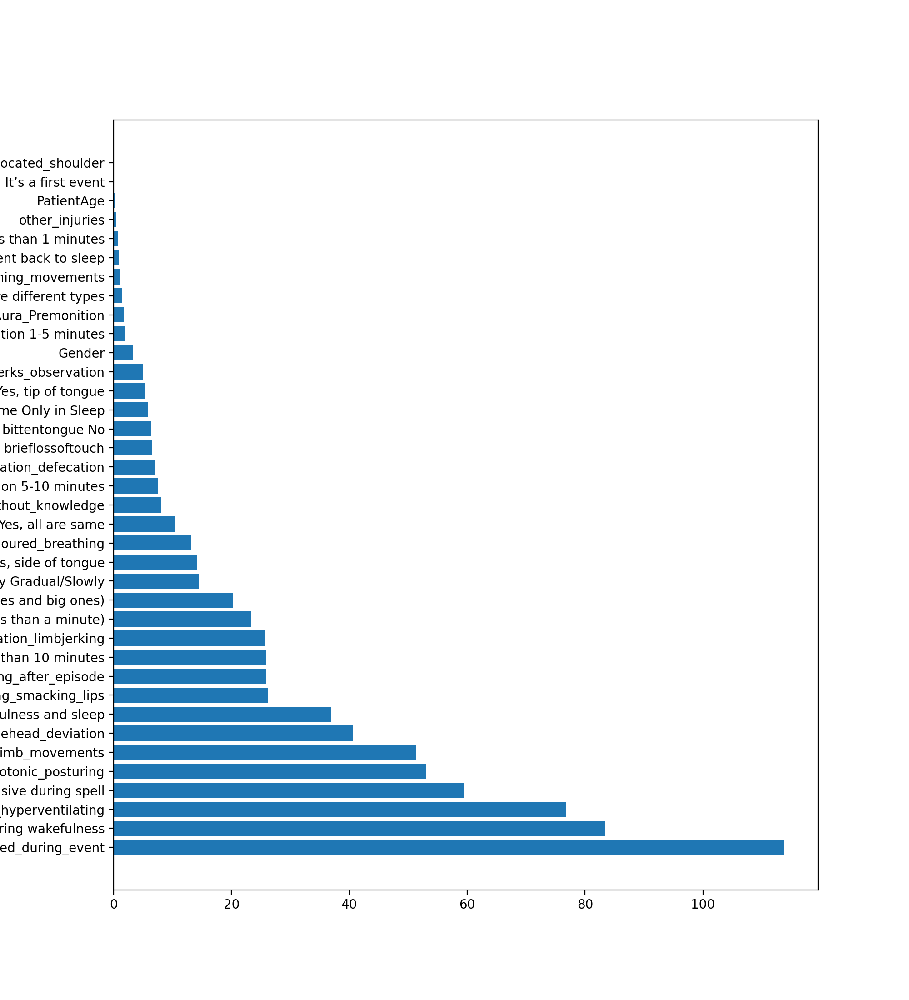

In [244]:
from matplotlib import pyplot
feature = []
for f in x_train.keys():
  feature.append(f)

f_mp = pd.Series()

for i in range(len(feature)):
  f_mp[feature[i]] = fs.scores_[i]

f_mp = f_mp.sort_values(ascending = False)

sc = []
feature = []

for k in f_mp.keys():
  feature.append(k)
  sc.append(f_mp[k])

pyplot.barh([feature[i] for i in range(len(fs.scores_))], sc)
pyplot.rcParams['figure.figsize'] = [10, 10]
pyplot.show()

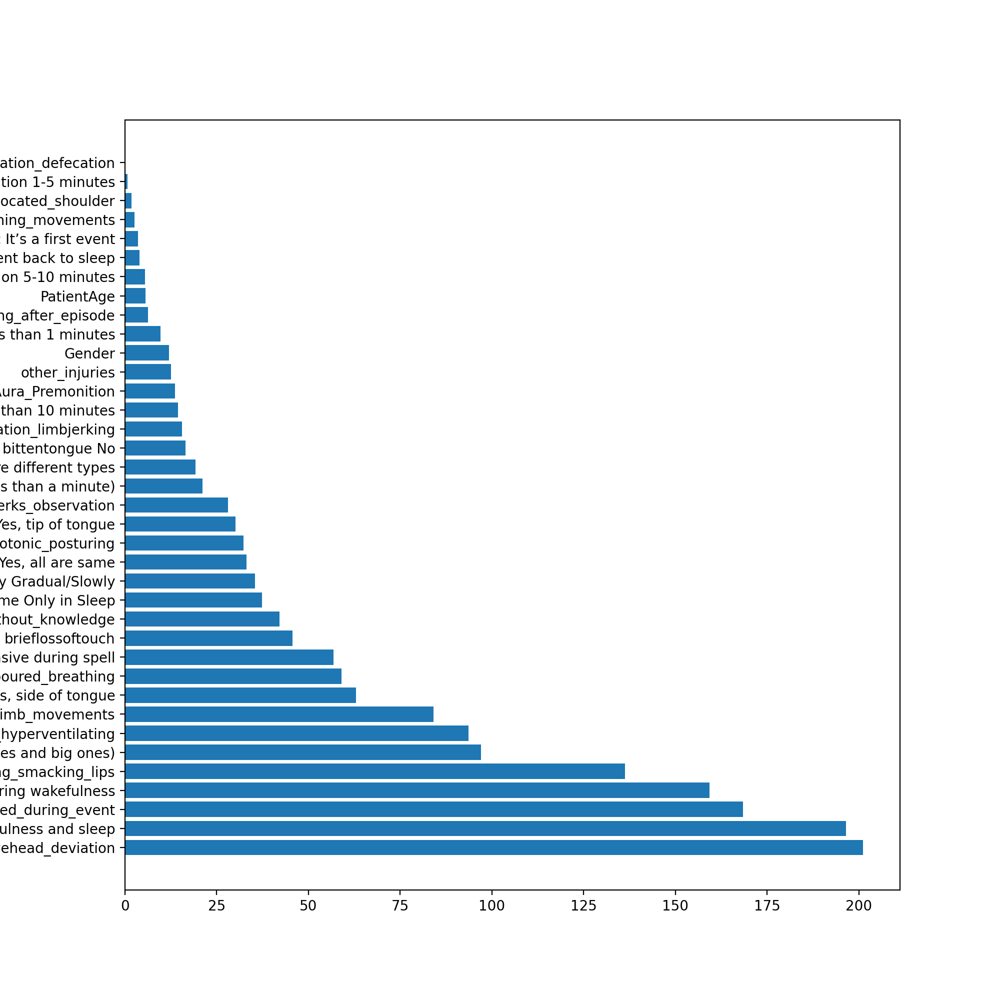

In [245]:
correlations['fscore'] = []

fs.fit(x_train_smote, y_train_smote)

for i in range(len(fs.scores_)):
	correlations['fscore'].append(fs.scores_[i])

feature = []
for f in x_train.keys():
  feature.append(f)

f_mp = pd.Series()

for i in range(len(feature)):
  f_mp[feature[i]] = fs.scores_[i]

f_mp = f_mp.sort_values(ascending = False)

sc = []
feature = []

for k in f_mp.keys():
  feature.append(k)
  sc.append(f_mp[k])

pyplot.barh([feature[i] for i in range(len(fs.scores_))], sc)
pyplot.rcParams['figure.figsize'] = [10, 10]
pyplot.show()

In [246]:
# correlation_df=[]
# correlation_df.append(pd.DataFrame(correlations['original']))
# correlation_df.append(pd.DataFrame(correlations['smote']))
# correlation_df.append(pd.DataFrame(correlations['fscore']))

len(compare_original_smote)

38

In [247]:
len(correlations['fscore'])

37

In [248]:
del compare_original_smote['Final_Diagnosis']
# correlations['smote'].drop('Final_Diagnosis', inplace = True)

len(compare_original_smote)

37

In [249]:
# after this snippet,
# 0 - f
# 1 - smote corr
# 2 - train corr

ind = 0

for k in compare_original_smote.keys():
  compare_original_smote[k].append(correlations['fscore'][ind])
  ind+=1

for array in compare_original_smote.values():
  array[0], array[2] = array[2], array[0]

sorted_value_index = np.argsort(compare_original_smote.values())
dictionary_keys = list(compare_original_smote.keys())
sorted_dict = {dictionary_keys[i]: sorted(
    compare_original_smote.values())[i] for i in range(len(dictionary_keys))}

print(sorted_dict)

{'PatientAge': [0.14285714285714285, 0.0, 0.09833869740305952], 'Gender': [0.627906976744186, 0.053148742285018064, 0.1400303199067439], 'eyes_closed_during_event': [1.8, 0.0, 0.0], 'weeping_before_during_after_episode': [2.5714285714285716, 0.03579454957458062, 0.0], 'patient_fall_suddenly_without_limb_movements': [3.6, 0.048905289595835635, 0.0], 'Was_patient_hyperventilating': [4.0, 0.044311044364221154, 0.0], 'loss_consciousness_after_urination_defecation': [5.487804878048781, 0.07989090520736825, 0.11793827857896193], 'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing': [5.65267711053135, 0.03665995237728891, 0.010284166236475328], 'observation_limbjerking': [6.25, 0.08072316820291038, 0.2360149405233213], 'observe_postevent_stridulous_laboured_breathing': [9.618181818181819, 0.11578521830528146, 0.0], 'upper_limb_jerks_observation': [11.964630225080386, 0.18236765808043645, 0.11901567515472682], 'brieflossoftouch': [12.565217391304348, 0.12803785036191973, 0.0], '

In [250]:
sorted_pd = pd.DataFrame(sorted_dict)
sorted_pd

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,events_occur_time Only during wakefulness,recovery Abrupt/Sudden (less than a minute),recovery Responsive during spell,recovery Didn’t recover went back to sleep,recovery Gradual/Slowly,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue",bittentongue No
0,0.142857,0.627907,1.8,2.571429,3.600000,4.000000,5.487805,5.652677,6.250000,9.618182,...,59.000000,63.000000,84.027778,93.633333,97.039604,136.243243,159.292428,168.491228,196.462963,201.169014
1,0.000000,0.053149,0.0,0.035795,0.048905,0.044311,0.079891,0.036660,0.080723,0.115785,...,0.309934,0.321908,0.404615,0.417192,0.416933,0.519320,0.777669,0.632433,0.673595,0.679274
2,0.098339,0.140030,0.0,0.000000,0.000000,0.000000,0.117938,0.010284,0.236015,0.000000,...,0.182629,0.191025,0.368621,0.446162,0.250347,0.315704,0.556680,0.571286,0.446040,0.464699


In [251]:
less_f = []
for col in sorted_pd:
  if sorted_pd[col][0]<0.05:
    less_f.append(col)


In [252]:
intersection_f_cor = []
for ele in less_correlation:
  if ele in less_f:
    intersection_f_cor.append(ele)

In [253]:
sorted_pd.drop(intersection_f_cor, axis = 1, inplace = True)
sorted_pd

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,events_occur_time Only during wakefulness,recovery Abrupt/Sudden (less than a minute),recovery Responsive during spell,recovery Didn’t recover went back to sleep,recovery Gradual/Slowly,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue",bittentongue No
0,0.142857,0.627907,1.8,2.571429,3.600000,4.000000,5.487805,5.652677,6.250000,9.618182,...,59.000000,63.000000,84.027778,93.633333,97.039604,136.243243,159.292428,168.491228,196.462963,201.169014
1,0.000000,0.053149,0.0,0.035795,0.048905,0.044311,0.079891,0.036660,0.080723,0.115785,...,0.309934,0.321908,0.404615,0.417192,0.416933,0.519320,0.777669,0.632433,0.673595,0.679274
2,0.098339,0.140030,0.0,0.000000,0.000000,0.000000,0.117938,0.010284,0.236015,0.000000,...,0.182629,0.191025,0.368621,0.446162,0.250347,0.315704,0.556680,0.571286,0.446040,0.464699


In [254]:
print(less_f)
print(less_correlation)
print(intersection_f_cor)

[]
['PatientAge', 'loss_consciousness_after_urination_defecation', 'violent_thrashing_movements', 'dislocated_shoulder', 'Stereotypic It’s a first event', 'recovery Didn’t recover went back to sleep']
[]


In [255]:
sorted_pd

,PatientAge,Gender,eyes_closed_during_event,weeping_before_during_after_episode,patient_fall_suddenly_without_limb_movements,Was_patient_hyperventilating,loss_consciousness_after_urination_defecation,side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing,observation_limbjerking,observe_postevent_stridulous_laboured_breathing,...,events_occur_time Only in Sleep,events_occur_time Both during wakefulness and sleep,events_occur_time Only during wakefulness,recovery Abrupt/Sudden (less than a minute),recovery Responsive during spell,recovery Didn’t recover went back to sleep,recovery Gradual/Slowly,"bittentongue Yes, tip of tongue","bittentongue Yes, side of tongue",bittentongue No
0,0.142857,0.627907,1.8,2.571429,3.600000,4.000000,5.487805,5.652677,6.250000,9.618182,...,59.000000,63.000000,84.027778,93.633333,97.039604,136.243243,159.292428,168.491228,196.462963,201.169014
1,0.000000,0.053149,0.0,0.035795,0.048905,0.044311,0.079891,0.036660,0.080723,0.115785,...,0.309934,0.321908,0.404615,0.417192,0.416933,0.519320,0.777669,0.632433,0.673595,0.679274
2,0.098339,0.140030,0.0,0.000000,0.000000,0.000000,0.117938,0.010284,0.236015,0.000000,...,0.182629,0.191025,0.368621,0.446162,0.250347,0.315704,0.556680,0.571286,0.446040,0.464699


In [256]:
x_train.drop(intersection_f_cor, axis=1,inplace=True)
x_test.drop(intersection_f_cor, axis=1,inplace=True)
x_train_smote.drop(intersection_f_cor, axis=1,inplace=True)

In [257]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score


accuracy_df = pd.DataFrame(columns=['Model','Before Smote','K fold before smote','confusion matrix before','Sensitivity before smote','Specificity before smote','After Smote','K fold after smote','Sensitivity after smote','Specificity after smote','confusion matrix after'])
dict_classifiers = {'Random Forest': RandomForestClassifier(),
                    'Logistic Regression': LogisticRegression(),
                    'SVC': SVC(),
                    'Decision Tree': DecisionTreeClassifier(),
                    'KNN': KNeighborsClassifier()
                    }
for clf_name, clf in dict_classifiers.items():
  #for validation
  cv = KFold(n_splits=10, random_state=42, shuffle=True)

  #before smote
  clf.fit(x_train, y_train)
  prediction1 = clf.predict(x_test)
  score1=accuracy_score(prediction1, y_test)
  fold_score1 = cross_val_score(clf, x_train, y_train, cv=cv)

  #confusion matrix
  cm1 = metrics.confusion_matrix(y_test, prediction1)
  cm_df1 = pd.DataFrame(cm1,
            columns = ['Predicted Negative', 'Predicted Positive'],
            index = ['Actual Negative', 'Actual Positive'])

  TP = cm1[1][1]
  TN = cm1[0][0]
  FP = cm1[0][1]
  FN = cm1[1][0]
  conf_sensitivity1 = (TP / float(TP + FN))
  conf_specificity1 = (TN / float(TN + FP))


  #after smote
  clf.fit(x_train_smote, y_train_smote)
  prediction2 = clf.predict(x_test)
  score2=accuracy_score(prediction2, y_test)
  fold_score2 = cross_val_score(clf, x_train_smote, y_train_smote, cv=cv)
  cm2 = metrics.confusion_matrix(y_test, prediction2)
  cm_df2 = pd.DataFrame(cm2,
            columns = ['Predicted Negative', 'Predicted Positive'],
            index = ['Actual Negative', 'Actual Positive'])

  TP = cm2[1][1]
  TN = cm2[0][0]
  FP = cm2[0][1]
  FN = cm2[1][0]

  conf_sensitivity2 = (TP / float(TP + FN))
  conf_specificity2 = (TN / float(TN + FP))

  # print(clf_name)
  # print("Before smote ",fold_score1,'\n',fold_score1.mean())
  # print("After smote ",fold_score2,'\n',fold_score2.mean(),'\n')

  new_row={
      'Model':clf_name,
       'Before Smote':score1,
       'K fold before smote':fold_score1.mean(),
       'confusion matrix before':cm_df1,
       'Sensitivity before smote':conf_sensitivity1,
       'Specificity before smote': conf_specificity1,
       'After Smote':score2 ,
       'K fold after smote': fold_score2.mean(),
       'Sensitivity after smote':conf_sensitivity2,
       'Specificity after smote': conf_specificity2,
       'confusion matrix after':cm_df2
  }
  accuracy_df=accuracy_df.append(new_row, ignore_index=True)

  # accuracy_dict[clf_name].append(score1)
  #print(clf_name,score1)
  # score2=accuracy_score(prediction2, y_test)
  # accuracy_dict[clf_name].append(score2)
  #print(clf_name,score2)


accuracy_df

,Model,Before Smote,K fold before smote,confusion matrix before,Sensitivity before smote,Specificity before smote,After Smote,K fold after smote,Sensitivity after smote,Specificity after smote,confusion matrix after
0,Random Forest,0.969697,0.956603,Predicted Negative Predicted...,0.904762,0.987179,0.969697,0.978293,0.952381,0.974359,Predicted Negative Predicted...
1,Logistic Regression,0.979798,0.954231,Predicted Negative Predicted...,0.952381,0.987179,0.969697,0.975168,1.000000,0.961538,Predicted Negative Predicted...
2,SVC,0.787879,0.817308,Predicted Negative Predicted...,0.000000,1.000000,0.878788,0.912885,0.857143,0.884615,Predicted Negative Predicted...
3,Decision Tree,0.949495,0.911410,Predicted Negative Predicted...,0.857143,0.974359,0.909091,0.962764,0.809524,0.935897,Predicted Negative Predicted...
4,KNN,0.949495,0.903590,Predicted Negative Predicted...,0.761905,1.000000,0.909091,0.920841,0.809524,0.935897,Predicted Negative Predicted...


In [260]:
accuracy_df.to_excel("/content/Results.xlsx")

#K-FOLD AND CONFIDENCE SCORE

###Test = x_test
###Train = x_train, y_train

In [262]:
import pandas as pd
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

def calculate_k_fold_score_and_confidence(clf, x_train, y_train, x_test):
    cv = KFold(n_splits=10, random_state=42, shuffle=True)
    fold_scores = cross_val_score(clf, x_train, y_train, cv=cv)

    clf.fit(x_train, y_train)

    if hasattr(clf, 'predict_proba'):
        confidence_scores = clf.predict_proba(x_test)
    elif hasattr(clf, 'decision_function'):
        decision_scores = clf.decision_function(x_test)
        confidence_scores = (decision_scores - decision_scores.min()) / (decision_scores.max() - decision_scores.min())
    else:
        raise ValueError("Classifier does not support either predict_proba or decision_function.")

    return fold_scores, confidence_scores

# Initialize an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Data', 'K-Fold Value', 'Confidence Score'])

for clf_name, clf in dict_classifiers.items():
    # Calculate k-fold scores and confidence scores for testing data
    fold_scores, confidence_scores = calculate_k_fold_score_and_confidence(clf, x_train, y_train, x_test)

    # Add results to the DataFrame
    for fold_num, (k_fold_score, confidence_score) in enumerate(zip(fold_scores, confidence_scores), start=1):
        result_row = {
            'Model': clf_name,
            'Data': 'Test',
            'K-Fold Value': k_fold_score,
            'Confidence Score': confidence_score
        }
        results_df = results_df.append(result_row, ignore_index=True)

# Display the combined results
print(results_df)
# Calculate the average values for each model
average_results = results_df.groupby('Model').mean().reset_index()

# Calculate the average Confidence Score for each model
average_confidence_scores = results_df.groupby('Model')['Confidence Score'].mean().reset_index()

# Merge the two DataFrames to include the average Confidence Score
average_results = pd.merge(average_results, average_confidence_scores, on='Model')

# Display the average results
print(average_results)



                  Model  Data  K-Fold Value  \
0         Random Forest  Test      1.000000   
1         Random Forest  Test      0.950000   
2         Random Forest  Test      1.000000   
3         Random Forest  Test      1.000000   
4         Random Forest  Test      0.974359   
5         Random Forest  Test      0.897436   
6         Random Forest  Test      0.923077   
7         Random Forest  Test      0.974359   
8         Random Forest  Test      0.923077   
9         Random Forest  Test      0.948718   
10  Logistic Regression  Test      1.000000   
11  Logistic Regression  Test      0.925000   
12  Logistic Regression  Test      1.000000   
13  Logistic Regression  Test      0.925000   
14  Logistic Regression  Test      0.948718   
15  Logistic Regression  Test      0.897436   
16  Logistic Regression  Test      0.897436   
17  Logistic Regression  Test      1.000000   
18  Logistic Regression  Test      0.948718   
19  Logistic Regression  Test      1.000000   
20           

### Test = Testing data(2) == new 100 data

### Train = x_train, y_train **bold text**

In [263]:
# before smote
import pandas as pd
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

testing_data = pd.read_excel("/content/Copy of Testing_data(2).xlsx")
testing_data.drop(testing_data .columns[0], axis=1, inplace=True)
testing_data.rename(columns={'side-to-side_head_nodding_pelvic_thrusting_Opisthotonic_posturing': 'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing'}, inplace=True)
# Get the column order from x_train
column_order = x_train.columns.tolist()

# Reorder the columns in testing_data to match the order in x_train
testing_data = testing_data[column_order]


def calculate_k_fold_score_and_confidence(clf, x_train, y_train, testing_data):
    cv = KFold(n_splits=10, random_state=42, shuffle=True)
    fold_scores = cross_val_score(clf, x_train, y_train, cv=cv)

    clf.fit(x_train, y_train)

    if hasattr(clf, 'predict_proba'):
        confidence_scores = clf.predict_proba(testing_data)
    elif hasattr(clf, 'decision_function'):
        decision_scores = clf.decision_function(testing_data)
        confidence_scores = (decision_scores - decision_scores.min()) / (decision_scores.max() - decision_scores.min())
    else:
        raise ValueError("Classifier does not support either predict_proba or decision_function.")

    return fold_scores, confidence_scores

# Initialize an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Data', 'K-Fold Value', 'Confidence Score'])

for clf_name, clf in dict_classifiers.items():
    # Calculate k-fold scores and confidence scores for testing data
    fold_scores, confidence_scores = calculate_k_fold_score_and_confidence(clf, x_train, y_train, testing_data)

    # Add results to the DataFrame
    for fold_num, (k_fold_score, confidence_score) in enumerate(zip(fold_scores, confidence_scores), start=1):
        result_row = {
            'Model': clf_name,
            'Data': 'Test',
            'K-Fold Value': k_fold_score,
            'Confidence Score': confidence_score
        }
        results_df = results_df.append(result_row, ignore_index=True)

# Display the combined results
print(results_df)
# Calculate the average values for each model
average_results = results_df.groupby('Model').mean().reset_index()

# Calculate the average Confidence Score for each model
average_confidence_scores = results_df.groupby('Model')['Confidence Score'].mean().reset_index()

# Merge the two DataFrames to include the average Confidence Score
average_results = pd.merge(average_results, average_confidence_scores, on='Model')

# Display the average results
print(average_results)



                  Model  Data  K-Fold Value  \
0         Random Forest  Test      1.000000   
1         Random Forest  Test      0.925000   
2         Random Forest  Test      0.975000   
3         Random Forest  Test      0.975000   
4         Random Forest  Test      0.974359   
5         Random Forest  Test      0.923077   
6         Random Forest  Test      0.897436   
7         Random Forest  Test      0.974359   
8         Random Forest  Test      0.923077   
9         Random Forest  Test      0.948718   
10  Logistic Regression  Test      1.000000   
11  Logistic Regression  Test      0.925000   
12  Logistic Regression  Test      1.000000   
13  Logistic Regression  Test      0.925000   
14  Logistic Regression  Test      0.948718   
15  Logistic Regression  Test      0.897436   
16  Logistic Regression  Test      0.897436   
17  Logistic Regression  Test      1.000000   
18  Logistic Regression  Test      0.948718   
19  Logistic Regression  Test      1.000000   
20           

### Test = Testing data(2) == new 100 data
### Train = x_train_smote, y_train_smote

In [264]:
import pandas as pd
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

testing_data = pd.read_excel("/content/Copy of Testing_data(2).xlsx")
testing_data.drop(testing_data .columns[0], axis=1, inplace=True)
testing_data.rename(columns={'side-to-side_head_nodding_pelvic_thrusting_Opisthotonic_posturing': 'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing'}, inplace=True)
# Get the column order from x_train
column_order = x_train.columns.tolist()

# Reorder the columns in testing_data to match the order in x_train
testing_data = testing_data[column_order]


def calculate_k_fold_score_and_confidence(clf, x_train_smote, y_train_smote, testing_data):
    cv = KFold(n_splits=10, random_state=42, shuffle=True)
    fold_scores = cross_val_score(clf, x_train_smote, y_train_smote, cv=cv)

    clf.fit(x_train_smote, y_train_smote)

    if hasattr(clf, 'predict_proba'):
        confidence_scores = clf.predict_proba(testing_data)
    elif hasattr(clf, 'decision_function'):
        decision_scores = clf.decision_function(testing_data)
        confidence_scores = (decision_scores - decision_scores.min()) / (decision_scores.max() - decision_scores.min())
    else:
        raise ValueError("Classifier does not support either predict_proba or decision_function.")

    return fold_scores, confidence_scores

# Initialize an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Data', 'K-Fold Value', 'Confidence Score'])

for clf_name, clf in dict_classifiers.items():
    # Calculate k-fold scores and confidence scores for testing data
    fold_scores, confidence_scores = calculate_k_fold_score_and_confidence(clf, x_train_smote, y_train_smote, testing_data)

    # Add results to the DataFrame
    for fold_num, (k_fold_score, confidence_score) in enumerate(zip(fold_scores, confidence_scores), start=1):
        result_row = {
            'Model': clf_name,
            'Data': 'Test',
            'K-Fold Value': k_fold_score,
            'Confidence Score': confidence_score
        }
        results_df = results_df.append(result_row, ignore_index=True)

# Display the combined results
print(results_df)

# Calculate the average values for each model
average_results = results_df.groupby('Model').mean().reset_index()

# Calculate the average Confidence Score for each model
average_confidence_scores = results_df.groupby('Model')['Confidence Score'].mean().reset_index()

# Merge the two DataFrames to include the average Confidence Score
average_results = pd.merge(average_results, average_confidence_scores, on='Model')

# Display the average results
print(average_results)



                  Model  Data  K-Fold Value  \
0         Random Forest  Test      0.938462   
1         Random Forest  Test      1.000000   
2         Random Forest  Test      0.984615   
3         Random Forest  Test      0.969231   
4         Random Forest  Test      1.000000   
5         Random Forest  Test      0.953125   
6         Random Forest  Test      1.000000   
7         Random Forest  Test      0.984375   
8         Random Forest  Test      0.937500   
9         Random Forest  Test      0.984375   
10  Logistic Regression  Test      0.938462   
11  Logistic Regression  Test      0.984615   
12  Logistic Regression  Test      0.984615   
13  Logistic Regression  Test      0.984615   
14  Logistic Regression  Test      1.000000   
15  Logistic Regression  Test      0.937500   
16  Logistic Regression  Test      0.984375   
17  Logistic Regression  Test      0.984375   
18  Logistic Regression  Test      0.984375   
19  Logistic Regression  Test      0.968750   
20           

##Average of max confidence score

In [265]:
# before smote
from sklearn.model_selection import KFold, cross_val_predict
import pandas as pd


testing_data = pd.read_excel("/content/Copy of Testing_data(2).xlsx")

def calculate_k_fold_score_and_confidence(clf, x_train, y_train, testing_data):
    cv = KFold(n_splits=10, random_state=42, shuffle=True)
    fold_scores = cross_val_predict(clf, x_train, y_train, cv=cv, method='predict_proba' if hasattr(clf, 'predict_proba') else 'decision_function')

    clf.fit(x_train, y_train)
    if hasattr(clf, 'predict_proba'):
        confidence_scores = clf.predict_proba(testing_data)
        max_confidence_scores = confidence_scores.max(axis=1)  # Get the maximum confidence score for each data entry
    elif hasattr(clf, 'decision_function'):
        confidence_scores = clf.decision_function(testing_data)
        confidence_scores = (confidence_scores - confidence_scores.min()) / (confidence_scores.max() - confidence_scores.min())
        if confidence_scores.ndim == 1:
            max_confidence_scores = confidence_scores
        else:
            max_confidence_scores = confidence_scores.max(axis=1)
    else:
        raise ValueError("Classifier does not support either predict_proba or decision_function.")

    return fold_scores, max_confidence_scores  # Return max_confidence_scores

# Initialize an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Model', 'Data', 'K-Fold Value', 'Max Confidence Score'])  # Update column name

for clf_name, clf in dict_classifiers.items():
    # Calculate k-fold scores and max confidence scores for testing data
    fold_scores, max_confidence_scores = calculate_k_fold_score_and_confidence(clf, x_train, y_train, x_test)

    # Add results to the DataFrame
    for fold_num, (k_fold_score, max_confidence_score) in enumerate(zip(fold_scores, max_confidence_scores), start=1):
        result_row = {
            'Model': clf_name,
            'Data': 'Test',
            'K-Fold Value': k_fold_score,
            'Max Confidence Score': max_confidence_score
        }
        results_df = results_df.append(result_row, ignore_index=True)

# Display the combined results
print(results_df)

# Calculate the average values for each model
average_results = results_df.groupby('Model').mean().reset_index()

# Display the average results
print(average_results)


             Model  Data  K-Fold Value  Max Confidence Score
0    Random Forest  Test    [1.0, 0.0]                  0.66
1    Random Forest  Test  [0.99, 0.01]                  0.98
2    Random Forest  Test    [1.0, 0.0]                  0.95
3    Random Forest  Test    [1.0, 0.0]                  0.92
4    Random Forest  Test    [1.0, 0.0]                  0.81
..             ...   ...           ...                   ...
490            KNN  Test    [1.0, 0.0]                  0.80
491            KNN  Test    [1.0, 0.0]                  0.80
492            KNN  Test    [0.8, 0.2]                  1.00
493            KNN  Test    [0.8, 0.2]                  1.00
494            KNN  Test    [0.8, 0.2]                  1.00

[495 rows x 4 columns]
                 Model  Max Confidence Score
0        Decision Tree              1.000000
1                  KNN              0.911111
2  Logistic Regression              0.946110
3        Random Forest              0.929192
4                  

#Get y_test for testing_data(2)

In [299]:
import pandas as pd

# Read the two data sets
df = pd.read_excel('/content/Copy of Epilepsy_testing_data_doctor_with_original_one_hot(1).xlsx')
df1 = pd.read_excel('/content/Copy of Testing_data(2).xlsx')

# Create a mapping dictionary from df using the first column as the key
mapping = df.set_index(df.columns[0])['Final_Diagnosis'].to_dict()

# Insert a new column in df1 with 'final diagnoses' values from df
df1['Final_Diagnosis'] = df1[df1.columns[0]].map(mapping)

# Save the updated df1 to a new Excel file
df1.to_excel('/content/new_test(100).xlsx', index=False)


## GET Accuracy on testing data(2)

In [300]:
from sklearn.model_selection import KFold, cross_val_predict
import pandas as pd
testing_data = pd.read_excel("/content/new_test(100).xlsx")

In [302]:
from sklearn.model_selection import train_test_split

y_newtest= testing_data.Final_Diagnosis
x_newtest=testing_data.drop('Final_Diagnosis',axis=1)

In [303]:
y_newtest

0     Non epileptic spell
1       Epileptic Seizure
2       Epileptic Seizure
3       Epileptic Seizure
4       Epileptic Seizure
             ...         
94      Epileptic Seizure
95      Epileptic Seizure
96      Epileptic Seizure
97      Epileptic Seizure
98      Epileptic Seizure
Name: Final_Diagnosis, Length: 99, dtype: object

In [318]:
# Sample mappings, you should update this with your actual mappings
numeric_mappings = {
    'Epileptic Seizure': 0,
    'Non epileptic spell': 1,
    # Add mappings for other values as needed
}

# Use the dictionary to convert values
y_newtest = [numeric_mappings.get(v, v) for v in y_newtest]


In [304]:
x_newtest.rename(columns={'side-to-side_head_nodding_pelvic_thrusting_Opisthotonic_posturing': 'side_to_side_head_nodding_pelvic_thrusting_Opisthotonic_posturing'}, inplace=True)


In [313]:
x_newtest= x_newtest.drop(['Unnamed: 0'], axis=1)

In [315]:
column_order = x_train.columns.tolist()

# Reorder the columns in testing_data to match the order in x_train
x_newtest = x_newtest[column_order]

In [320]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score


accuracy_df = pd.DataFrame(columns=['Model','Before Smote','K fold before smote','confusion matrix before','Sensitivity before smote','Specificity before smote','After Smote','K fold after smote','Sensitivity after smote','Specificity after smote','confusion matrix after'])
dict_classifiers = {'Random Forest': RandomForestClassifier(),
                    'Logistic Regression': LogisticRegression(),
                    'SVC': SVC(),
                    'Decision Tree': DecisionTreeClassifier(),
                    'KNN': KNeighborsClassifier()
                    }
for clf_name, clf in dict_classifiers.items():
  #for validation
  cv = KFold(n_splits=10, random_state=42, shuffle=True)

  #before smote
  clf.fit(x_train, y_train)
  prediction1 = clf.predict(x_newtest)
  score1=accuracy_score(prediction1, y_newtest)
  fold_score1 = cross_val_score(clf, x_train, y_train, cv=cv)

  #confusion matrix
  cm1 = metrics.confusion_matrix(y_newtest, prediction1)
  cm_df1 = pd.DataFrame(cm1,
            columns = ['Predicted Negative', 'Predicted Positive'],
            index = ['Actual Negative', 'Actual Positive'])

  TP = cm1[1][1]
  TN = cm1[0][0]
  FP = cm1[0][1]
  FN = cm1[1][0]
  conf_sensitivity1 = (TP / float(TP + FN))
  conf_specificity1 = (TN / float(TN + FP))


  #after smote
  clf.fit(x_train_smote, y_train_smote)
  prediction2 = clf.predict(x_newtest)
  score2=accuracy_score(prediction2, y_newtest)
  fold_score2 = cross_val_score(clf, x_train_smote, y_train_smote, cv=cv)
  cm2 = metrics.confusion_matrix(y_newtest, prediction2)
  cm_df2 = pd.DataFrame(cm2,
            columns = ['Predicted Negative', 'Predicted Positive'],
            index = ['Actual Negative', 'Actual Positive'])

  TP = cm2[1][1]
  TN = cm2[0][0]
  FP = cm2[0][1]
  FN = cm2[1][0]

  conf_sensitivity2 = (TP / float(TP + FN))
  conf_specificity2 = (TN / float(TN + FP))

  # print(clf_name)
  # print("Before smote ",fold_score1,'\n',fold_score1.mean())
  # print("After smote ",fold_score2,'\n',fold_score2.mean(),'\n')

  new_row={
      'Model':clf_name,
       'Before Smote':score1,
       'K fold before smote':fold_score1.mean(),
       'confusion matrix before':cm_df1,
       'Sensitivity before smote':conf_sensitivity1,
       'Specificity before smote': conf_specificity1,
       'After Smote':score2 ,
       'K fold after smote': fold_score2.mean(),
       'Sensitivity after smote':conf_sensitivity2,
       'Specificity after smote': conf_specificity2,
       'confusion matrix after':cm_df2
  }
  accuracy_df=accuracy_df.append(new_row, ignore_index=True)

  # accuracy_dict[clf_name].append(score1)
  #print(clf_name,score1)
  # score2=accuracy_score(prediction2, y_newtest)
  # accuracy_dict[clf_name].append(score2)
  #print(clf_name,score2)


accuracy_df

,Model,Before Smote,K fold before smote,confusion matrix before,Sensitivity before smote,Specificity before smote,After Smote,K fold after smote,Sensitivity after smote,Specificity after smote,confusion matrix after
0,Random Forest,0.717172,0.954103,Predicted Negative Predicted...,0.000000,0.910256,0.787879,0.975192,0.000000,1.000000,Predicted Negative Predicted...
1,Logistic Regression,0.585859,0.954231,Predicted Negative Predicted...,0.000000,0.743590,0.767677,0.975168,0.000000,0.974359,Predicted Negative Predicted...
2,SVC,0.787879,0.817308,Predicted Negative Predicted...,0.000000,1.000000,0.343434,0.912885,0.095238,0.410256,Predicted Negative Predicted...
3,Decision Tree,0.727273,0.908910,Predicted Negative Predicted...,0.190476,0.871795,0.373737,0.964303,0.761905,0.269231,Predicted Negative Predicted...
4,KNN,0.484848,0.903590,Predicted Negative Predicted...,0.047619,0.602564,0.383838,0.920841,0.095238,0.461538,Predicted Negative Predicted...


# User Interface

In [ ]:
from openpyxl import *
from tkinter import *

def clear():
  for field_value in field_entry_boxes:
    field_value.delete(0, END)

def insert():

  df.loc[len(df.index)] = ['Amy', 89, 93]
  row = []

  for field_value in field_entry_boxes:
    row.append(field_value)

  df.loc[len(df.index)] = row
  field_entry_boxes[len(field_entry_boxes)-1].focus_set()
  clear()

if __name__ == "__main__":
    root = Tk()
    root.configure(background='light green')
    root.title("Symptoms Form")
    root.geometry("500x300")

    heading = Label(root, text="Form", bg="light green")

    labels = []
    field_entry_boxes = []

    for i, column in enumerate(columns):
      labels.append(Label(root, text=column, bg="light green"))
      field_entry_boxes.append(Entry(root))
      field_entry_boxes[i].grid(row=i, column=1, ipadx="100")

    for i in range(len(columns)-1):
      field_entry_boxes[i].bind("<Return>", field_entry_boxes[i+1].focus_set())

    heading.grid(row=0, column=1)
    submit = Button(root, text="Submit", fg="Black",
                            bg="Red", command=insert)
    submit.grid(row=8, column=1)

    # start the GUI
    root.mainloop()